In [1]:
import os

# Data processing
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt

# NLP
import lucem_illud_2020
import spacy
import nltk
import gensim
from wordcloud import WordCloud
nlp = spacy.load('en')

# Machine Learning
import sklearn
import sklearn.manifold
import sklearn.cluster
import sklearn.feature_extraction
import sklearn.decomposition
import sklearn.metrics

%matplotlib notebook

In [2]:
# In the corpus 'URY_40_1985.txt' has been mistakenly named as 'URY_49_1985.txt'. 
# We have corrected it by hand. 

file_path = '../corpus/Converted sessions/'
entry_list = []

list_of_folders = os.listdir(file_path)
for session in list_of_folders:
    if not session.startswith('.') and 'Session' in session: 
        list_of_files = os.listdir(file_path + session)
    else: 
        list_of_files = []
    for country in list_of_files: 
        if not country.startswith('.') and '.txt' in country:
            filename = country.split('.')[0].split('_')
            country_code = filename[0]
            session_code = filename[1]
            year_code = filename[2]
            text = open(file_path + session + '/' + country).read()
            entry_list.append(pd.Series({'filename': country, 
                                         'country_code': country_code, 
                                         'session': session_code, 
                                         'year': year_code, 
                                         'text': text}))

ungdc_df = pd.DataFrame(entry_list)

In [3]:
ungdc_df = ungdc_df.sort_values(by=['session', 'country_code'], axis=0, ascending=(True, True))
ungdc_df = ungdc_df.reset_index(drop=True)

In [4]:
ungdc_df

,filename,country_code,session,year,text
0,ALB_25_1970.txt,ALB,25,1970,33: May I first convey to our President the co...
1,ARG_25_1970.txt,ARG,25,1970,177.\t : It is a fortunate coincidence that pr...
2,AUS_25_1970.txt,AUS,25,1970,100.\t It is a pleasure for me to extend to y...
3,AUT_25_1970.txt,AUT,25,1970,155.\t May I begin by expressing to Ambassado...
4,BEL_25_1970.txt,BEL,25,1970,"176. No doubt each of us, before coming up to ..."
...,...,...,...,...,...
8088,WSM_73_2018.txt,WSM,73,2018,I have had the privilege of addressing the G...
8089,YEM_73_2018.txt,YEM,73,2018,On behalf of the Government and the people of ...
8090,ZAF_73_2018.txt,ZAF,73,2018,I have the honour to address the General Assem...
8091,ZMB_73_2018.txt,ZMB,73,2018,Let me join other world leaders in con...


In [20]:
# print(ungdc_df.head(10).to_latex(index=False, caption='Preview of the UNGDC corpus', label='data preview'))

<IPython.core.display.Javascript object>


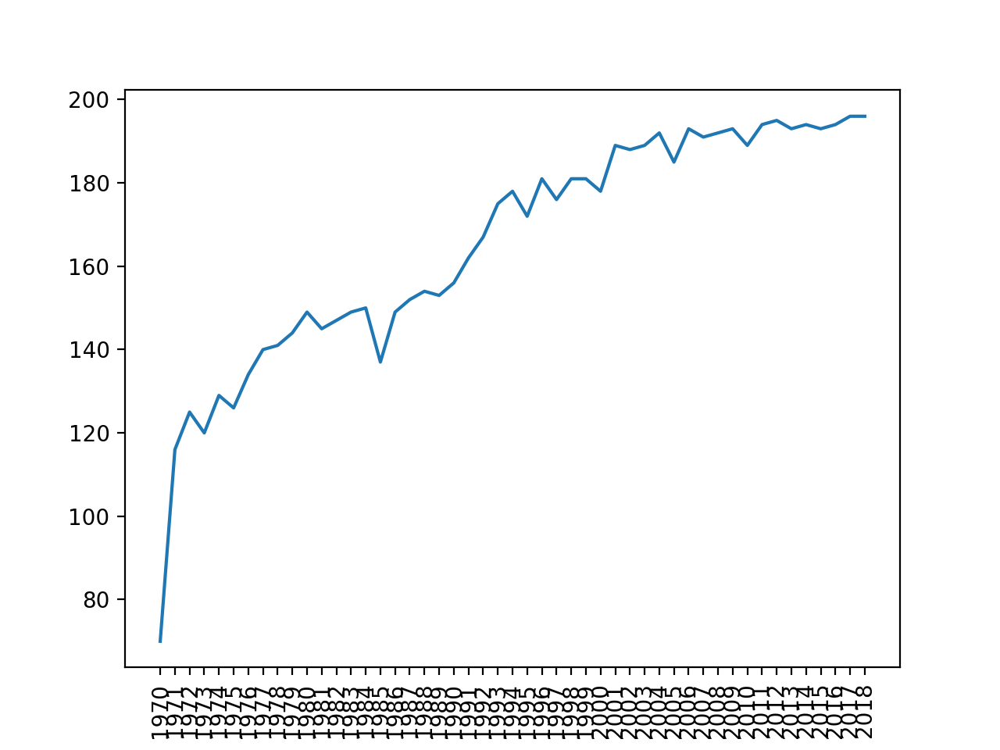

In [10]:
# Plot number of nations that addressed statements on each year's debate
fig, ax = plt.subplots()
ax.plot(ungdc_df.groupby(['year'])['filename'].count())
plt.xticks(rotation=90)
plt.show()

In [11]:
# Investigate the change of member nations that attended the conference over years

year_pre = pd.Series(np.arange(1970, 2018))
year_post = pd.Series(np.arange(1971, 2019))

def country_set(year): 
    return set(ungdc_df[ungdc_df['year'] == str(year)]['country_code'].unique())


In [12]:
plus_members = np.array(year_post.apply(country_set)) - np.array(year_pre.apply(country_set))
minus_members = np.array(year_pre.apply(country_set)) - np.array(year_post.apply(country_set))

In [16]:
state_changes = pd.DataFrame({'year': np.arange(1971, 2019), 
              'plus': [' '.join(list(entry)) for entry in np.array(plus_members)], 
              'minus': [' '.join(list(entry)) for entry in np.array(minus_members)]})
state_changes

,year,plus,minus
0,1971,IRL LUX POL CHL MLI CHN YDYE CAF BFA MUS PAN M...,HND CRI GMB
1,1972,MWI HND SWZ CRI DNK ARE BTN GMB BHR OMN BRB PRT,PAN NOR TTO
2,1973,PAN DEU BHS LSO DDR NOR,MWI DOM SWZ GMB CIV UGA TGO MLT CMR TCD BRB
3,1974,DOM SWZ GMB BGD GRD CIV GNQ UGA BWA TGO MLT CM...,PAN FJI ZAF BHS MDG
4,1975,MOZ PAN MWI FJI MDG,LBN LUX SWZ GMB HTI CIV EGY MLT
5,1976,LBN CPV SWZ MDV PNG COM GNB STP EGY MLT SUR,MWI GNQ THA
6,1977,MWI LUX AGO WSM GMB TTO HTI CIV SYC THA,GUY DOM GAB MLT
7,1978,DOM GNQ GAB VNM MLT GUY,MWI SWZ PRY GIN SAU
8,1979,DJI MWI DMA PRY VAT GIN SAU,GMB DNK SWE AGO
9,1980,SWZ LCA VCT AGO DNK SWE GMB BHS ZWE,KWT WSM DMA VAT


In [19]:
# print(state_changes.to_latex(index=False, caption='Changes of participating states over years', label='state changes'))

## Word Frequency

### Tokenized & normalize

In [21]:
ungdc_df['text_tokenized_words'] = ungdc_df['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))

In [22]:
ungdc_df['text_normalized_words'] = ungdc_df['text_tokenized_words'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [23]:
ungdc_df.head()

,filename,country_code,session,year,text,text_tokenized_words,text_normalized_words
0,ALB_25_1970.txt,ALB,25,1970,33: May I first convey to our President the co...,"[33, May, I, first, convey, to, our, President...","[convey, president, congratulation, albanian, ..."
1,ARG_25_1970.txt,ARG,25,1970,177.\t : It is a fortunate coincidence that pr...,"[177, It, is, a, fortunate, coincidence, that,...","[fortunate, coincidence, precisely, time, unit..."
2,AUS_25_1970.txt,AUS,25,1970,100.\t It is a pleasure for me to extend to y...,"[100, It, is, a, pleasure, for, me, to, extend...","[pleasure, extend, mr, president, warm, congra..."
3,AUT_25_1970.txt,AUT,25,1970,155.\t May I begin by expressing to Ambassado...,"[155, May, I, begin, by, expressing, to, Ambas...","[begin, express, ambassador, hambro, behalf, d..."
4,BEL_25_1970.txt,BEL,25,1970,"176. No doubt each of us, before coming up to ...","[176, No, doubt, each, of, us, before, coming,...","[doubt, come, rostrum, wonder, usefulness, fut..."


### Calculate mean speach length

In [17]:
ungdc_df['token_count'] = ungdc_df['text_tokenized_words'].apply(lambda x: len(x))

<IPython.core.display.Javascript object>


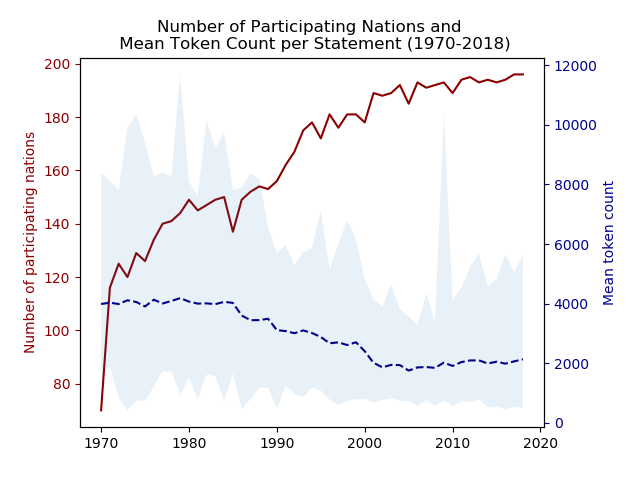

In [18]:
# Plot number of participating nations and mean token count
fig, ax1 = plt.subplots()
year_axis = np.arange(1970, 2019)
ax1.plot(year_axis, ungdc_df.groupby(['year'])['filename'].count(), linestyle='-', label='number of participating nations', color='darkred')
ax1.set_ylabel('Number of participating nations', color='darkred')
ax1.tick_params(axis='y', colors='darkred')

ax2 = ax1.twinx()
ax2.plot(year_axis, ungdc_df.groupby(['year'])['token_count'].mean(), linestyle='--', label='mean token count', color='darkblue')
ax2.fill_between(year_axis, 
                 ungdc_df.groupby(['year'])['token_count'].max(), 
                 ungdc_df.groupby(['year'])['token_count'].min(), 
                 alpha=0.1)
ax2.set_ylabel('Mean token count', color='darkblue')
ax2.tick_params(axis='y', colors='darkblue')

plt.gcf().subplots_adjust(right=0.85)
plt.title('Number of Participating Nations and \n Mean Token Count per Statement (1970-2018)')

plt.show()

### word frequency using total corpus

In [217]:
# # Define a word counter
# def wordCounter(word_list):
#     wordCounts = {}
#     for word in word_list: 
# #         In case that the words are not normalized
# #         wLower = word.lower()
#         if word in wordCounts:
#             wordCounts[word] += 1
#         else:
#             wordCounts[word = 1
#     #convert to DataFrame
#     countsForFrame = {'word' : [], 'count' : []}
#     for w, c in wordCounts.items():
#         countsForFrame['word'].append(w)
#         countsForFrame['count'].append(c)
#     return pd.DataFrame(countsForFrame)

In [218]:
# word_freq = wordCounter(ungdc_df['text_normalized_words'].sum())
# word_freq.head()

### word frequency conditional on POS

In [170]:
# Define a function that implements POS using `spacy`
def spacy_pos(word_list):
    tags = []
    doc = nlp(word_list.replace('co-operation', 'cooperation').lower())  # 'co-operation' cannot be correctly parsed. 
    for w in doc:
        tags.append((w.text, w.tag_))
    return tags

In [171]:
ungdc_df['normalized_tokens_POS'] = [spacy_pos(t) for t in ungdc_df['text']]

In [172]:
ungdc_POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in ungdc_df['normalized_tokens_POS'].sum())

In [173]:
# The most frequent nouns. 
ungdc_POStoWord['NN'].most_common(20)

[('world', 89554),
 ('peace', 80502),
 ('development', 65756),
 ('country', 43810),
 ('security', 42431),
 ('government', 39379),
 ('community', 38352),
 ('organization', 32257),
 ('cooperation', 30727),
 ('session', 30470),
 ('time', 26689),
 ('order', 24945),
 ('year', 24584),
 ('situation', 23277),
 ('state', 22676),
 ('region', 22626),
 ('support', 21337),
 ('process', 20378),
 ('today', 20113),
 ('conference', 19773)]

<IPython.core.display.Javascript object>


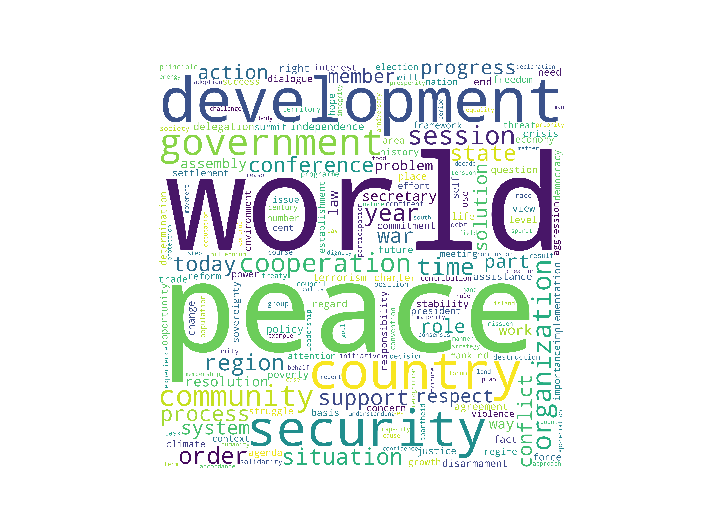

In [174]:
wordcloud_freq_dict = {}
for entry in ungdc_POStoWord['NN'].most_common(500): 
    wordcloud_freq_dict[entry[0]] = entry[1]

wc = WordCloud(background_color="white", width= 2000, height = 2000, mode ='RGBA', scale=2)
wc.generate_from_frequencies(wordcloud_freq_dict)
plt.imshow(wc)
plt.axis("off")
plt.show()
# plt.savefig("ungdc_word_cloud.pdf", format = 'pdf')
# wc.to_image()

<IPython.core.display.Javascript object>


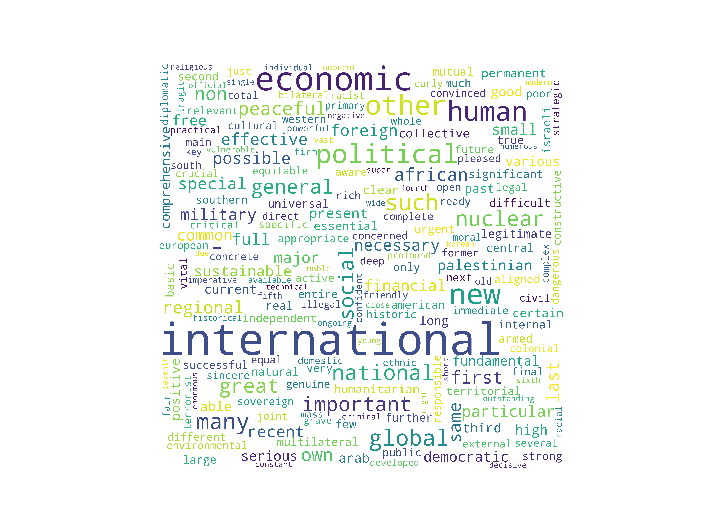

In [181]:
wordcloud_freq_dict = {}
for entry in ungdc_POStoWord['JJ'].most_common(500): 
    wordcloud_freq_dict[entry[0]] = entry[1]

wc = WordCloud(background_color="white", width= 2000, height = 2000, mode ='RGBA', scale=2)
wc.generate_from_frequencies(wordcloud_freq_dict)
plt.imshow(wc)
plt.axis("off")
plt.show()
# plt.savefig("ungdc_word_cloud.pdf", format = 'pdf')
# wc.to_image()

### word frequency by country

In [175]:
ungdc_POStoWord_by_country = {}
groupby_country_df = ungdc_df[['country_code', 'normalized_tokens_POS']].groupby('country_code').sum()

for index, row in groupby_country_df.iterrows():
     ungdc_POStoWord_by_country[row.name] = nltk.ConditionalFreqDist((p, w) for w, p in row['normalized_tokens_POS'])

In [176]:
country_list = ungdc_df['country_code'].unique()
word_freq_by_country = pd.DataFrame()
for country in country_list: 
    word_freq_by_country[country] = pd.Series([word_freq[0] for word_freq in ungdc_POStoWord_by_country[country]['NN'].most_common(20)], 
                                              index=np.arange(1, 21))

In [177]:
word_freq_by_country

,ALB,ARG,AUS,AUT,BEL,BLR,BOL,BRA,CAN,CMR,...,NRU,TON,TUV,CHE,KIR,TLS,MNE,SRB,EU,SSD
1,peace,world,world,peace,world,world,world,world,world,world,...,development,development,climate,world,climate,country,development,world,world,peace
2,world,country,peace,world,peace,peace,country,peace,peace,peace,...,nauru,year,change,peace,development,world,peace,region,today,government
3,security,peace,security,security,development,security,government,development,security,development,...,climate,climate,development,development,change,development,implementation,country,peace,country
4,country,government,government,development,country,development,peace,cooperation,development,organization,...,world,island,island,security,world,peace,cooperation,peace,change,agreement
5,government,development,development,cooperation,organization,cooperation,development,country,government,security,...,change,work,security,law,community,government,world,member,crisis,development
6,policy,cooperation,year,year,security,war,time,security,year,session,...,island,change,world,country,security,community,climate,development,year,community
7,region,organization,community,conference,community,state,community,community,organization,community,...,security,government,action,today,time,state,security,cooperation,hope,conflict
8,struggle,today,time,organization,cooperation,disarmament,order,organization,time,cameroon,...,work,security,support,conflict,level,security,change,today,climate,security
9,development,security,organization,government,belgium,time,state,order,member,country,...,action,energy,peace,organization,family,year,stability,future,security,implementation
10,cooperation,time,treaty,conflict,action,session,problem,trade,action,situation,...,country,session,country,member,support,today,importance,law,time,support


In [179]:
word_freq_by_country.to_csv('most_common_words_by_country.csv')

## Reveal multi-dimensional preferences using tf-idf and PCA: taking US-China and US-EU as an example. 

### tf-idf (also used by other analyses)

In [24]:
ungdc_df['joined_normalized_words'] = ungdc_df['text_normalized_words'].apply(lambda x: ' '.join(x))

In [25]:
# tfidf: set max_df=0.7, min_df=5
tfidf_vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(stop_words='english', max_df=0.7, min_df=5).fit(ungdc_df['joined_normalized_words'])
tfidf_vects = tfidf_vectorizer.transform(ungdc_df['joined_normalized_words'])

In [29]:
# tfidf_vects_pca = sklearn.decomposition.PCA(n_components=1).fit_transform(np.stack(ungdc_df['tfidf_vect'], axis=0))
tfidf_vects_pca = sklearn.decomposition.PCA(n_components=1).fit_transform(tfidf_vects.toarray())

In [30]:
ungdc_df['pca'] = [v for v in tfidf_vects_pca]

<IPython.core.display.Javascript object>


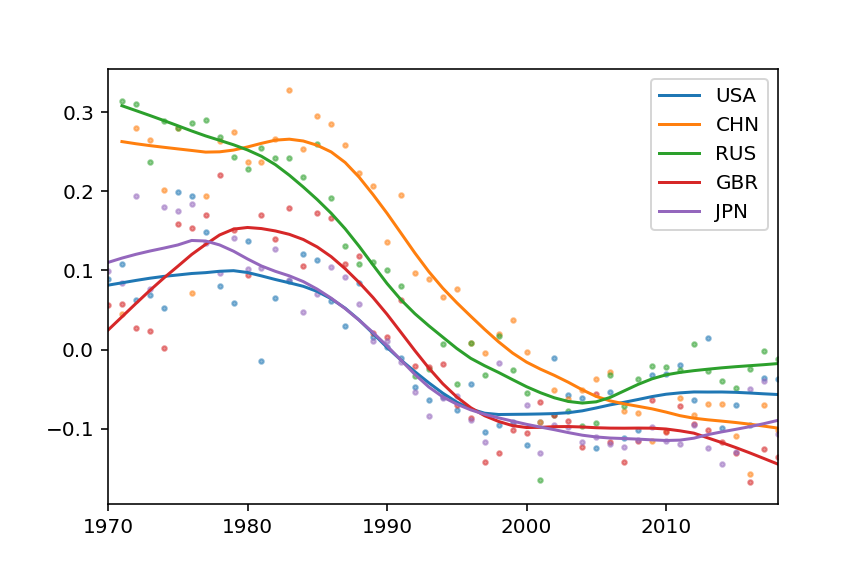

In [166]:
import statsmodels.api as sm

target = ['USA', 'CHN', 'RUS', 'GBR', 'JPN'] # 'IRN', 'IRQ', 'KWT', 'LBN', 'QAT', 'SAU', 'SYR', 'TUR', 'ARE'

dict_each_country = {}
for country_code in target: 
    country_df = ungdc_df[ungdc_df['country_code'] == country_code][['year', 'pca']]
    vect_each_year = []
    for year in range(1970, 2019): 
        if str(year) in country_df['year'].unique(): 
            vect_each_year.append(float(country_df[country_df['year'] == str(year)]['pca']))
        else: 
            vect_each_year.append(None)
    dict_each_country[country_code] = vect_each_year

year_axis = np.arange(1970, 2019)
fig, ax = plt.subplots()
for country_code in target: 
    plt.scatter(year_axis, dict_each_country[country_code], alpha=0.5, s=5)
    lowess_smoothing = sm.nonparametric.lowess(dict_each_country[country_code], year_axis, frac=.3)
    lowess_x = list(zip(*lowess_smoothing))[0]
    lowess_y = list(zip(*lowess_smoothing))[1]
    plt.plot(lowess_x, lowess_y, '-', label=country_code)
    
ax.set_xlim(1970, 2018)
# plt.xticks(rotation=90)
plt.legend()
# plt.title('Multi-dimensional State Preferences Revelation (1970-2018)')
plt.show()

<IPython.core.display.Javascript object>


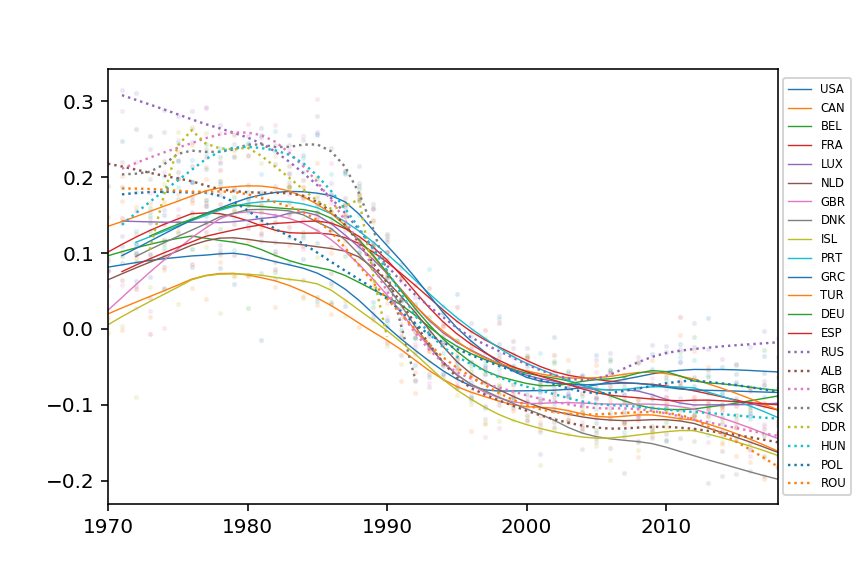

In [164]:
# See cold war. 
NATO = ['USA', 'CAN', 'BEL', 'FRA', 'LUX', 'NLD', 'GBR', 'DNK', 'ISL', 'PRT', 'GRC', 'TUR', 'DEU', 'ESP']
WTO = ['RUS', 'ALB', 'BGR', 'CSK', 'DDR', 'HUN', 'POL', 'ROU']

target = NATO + WTO # 'IRN', 'IRQ', 'KWT', 'LBN', 'QAT', 'SAU', 'SYR', 'TUR', 'ARE'

dict_each_country = {}
for country_code in target: 
    country_df = ungdc_df[ungdc_df['country_code'] == country_code][['year', 'pca']]
    vect_each_year = []
    for year in range(1970, 2019): 
        if str(year) in country_df['year'].unique(): 
            vect_each_year.append(float(country_df[country_df['year'] == str(year)]['pca']))
        else: 
            vect_each_year.append(None)
    dict_each_country[country_code] = vect_each_year

year_axis = np.arange(1970, 2019)
fig, ax = plt.subplots()
for country_code in target: 
    if country_code in NATO: 
        line = '-'
        width = 0.7
    else: 
        line = ':'
        width = 1.2
    plt.scatter(year_axis, dict_each_country[country_code], alpha=0.1, s=3)
    lowess_smoothing = sm.nonparametric.lowess(dict_each_country[country_code], year_axis, frac=.3)
    lowess_x = list(zip(*lowess_smoothing))[0]
    lowess_y = list(zip(*lowess_smoothing))[1]
    plt.plot(lowess_x, lowess_y, line, linewidth=width, label=country_code)
    
ax.set_xlim(1970, 2018)
# plt.xticks(rotation=90)
box = ax.get_position()
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='xx-small')
# plt.title('Multi-dimensional State Preferences Revelation: WATO and WTO (1970-2018)')
plt.show()

## K-means clustering using tf-idf

In [86]:
len(tfidf_vects.data)

4545763

In [109]:
num_clusters = 36
k_means_cluster = sklearn.cluster.KMeans(n_clusters=num_clusters, init='k-means++').fit(tfidf_vects)

In [110]:
# top 20 distinguishing features in each cluster:
terms = tfidf_vectorizer.get_feature_names()
order_centroids = k_means_cluster.cluster_centers_.argsort()[:, ::-1]
distinguish_features_df = pd.DataFrame()
for i in range(num_clusters):
    term_list = []
    for ind in order_centroids[i, :20]:
        term_list.append(terms[ind])
    distinguish_features_df[f'Cluster {i}'] = term_list

distinguish_features_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,Cluster 9,...,Cluster 26,Cluster 27,Cluster 28,Cluster 29,Cluster 30,Cluster 31,Cluster 32,Cluster 33,Cluster 34,Cluster 35
0,iraq,terrorism,soviet,morocco,bahamas,africa,guatemala,sudan,ecuador,japan,...,latvia,turkey,pacific,spain,pakistan,paraguay,caribbean,tunisia,myanmar,honduras
1,kuwait,reform,socialist,algeria,drug,south,belize,malawi,peru,nuclear,...,baltic,cyprus,island,spanish,india,bolivia,saint,arab,drug,nicaragua
2,lebanon,cooperation,nuclear,mauritania,haiti,african,guatemalan,somalia,latin,japanese,...,reform,turkish,fiji,gibraltar,sri,bolivian,barbados,tunisian,rakhine,costa
3,iraqi,nuclear,republic,arab,caribbean,namibia,american,ethiopia,peruvian,assistance,...,latvian,greece,zealand,operation,lanka,latin,grenada,maghreb,narcotic,haiti
4,lebanese,afghanistan,disarmament,maghreb,small,independence,central,kenya,american,operation,...,european,greek,solomon,european,kashmir,america,small,african,opium,salvador
5,arab,weapon,relation,african,traffic,regime,guatemalans,eritrea,america,weapon,...,sustainable,cypriots,small,mediterranean,nuclear,american,island,solidarity,poppy,rica
6,iran,millennium,weapon,sahara,island,struggle,america,somali,democracy,reform,...,afghanistan,cypriot,climate,europe,afghanistan,drug,dominica,palestinian,nuclear,dominican
7,aggression,terrorist,imperialist,africa,illicit,apartheid,caribbean,africa,drug,disarmament,...,union,european,samoa,possible,terrorism,democracy,lucia,mediterranean,reform,central
8,israel,poverty,detente,kingdom,commonwealth,delegation,drug,african,andean,korea,...,europe,settlement,tuvalu,crisis,indian,coca,kitts,ben,constitution,el
9,islamic,sustainable,union,palestinian,south,republic,democracy,igad,power,intend,...,syria,union,sustainable,terrorism,south,paraguayan,haiti,stability,democratic,american


In [145]:
# print(distinguish_features_df.head(10)[['Cluster ' + str(i) for i in range(27, 36)]].to_latex(index=False, caption='Distinguishing Features of K-means Cluster Centroids', label='kmeans tfidf centroids'))

In [111]:
# Perform PCA to reduce dimensions and visualize in 2-D graphs
tfidf_vects_pca_to2d = sklearn.decomposition.PCA(n_components = 2).fit_transform(tfidf_vects.toarray())

colors = list(plt.cm.rainbow(np.linspace(0,1, num_clusters)))
colors_p = [colors[l] for l in k_means_cluster.labels_]

<IPython.core.display.Javascript object>


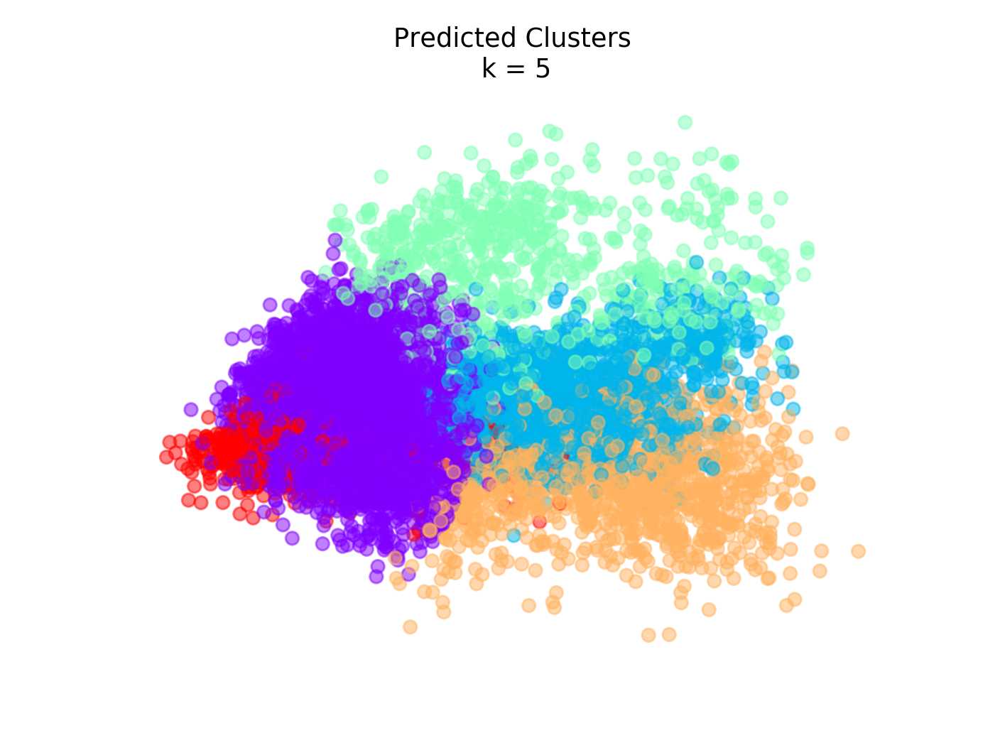

In [141]:
fig = plt.figure(1)
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tfidf_vects_pca_to2d[:, 0], tfidf_vects_pca_to2d[:, 1], color = colors_p, alpha = 0.5)
plt.xticks(())
plt.yticks(())
plt.title('Predicted Clusters\n k = {}'.format(num_clusters))
plt.show()

In [93]:
# Optimize for the best value for K. 

def plotSilhouette(n_clusters, X, reducedPCA_data):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (15,5))
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
    silhouette_avg = sklearn.metrics.silhouette_score(X, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = sklearn.metrics.silhouette_samples(X, cluster_labels)

    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        cmap = matplotlib.cm.get_cmap("nipy_spectral")
        color = cmap(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10
    
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    
    cmap = matplotlib.cm.get_cmap("nipy_spectral")
    colors = cmap(np.linspace(0,1, n_clusters))
    colors_p = [colors[l] for l in cluster_labels]
    
#     cmap = matplotlib.cm.get_cmap("nipy_spectral")
#     colors = cmap(float(i) / n_clusters)
    ax2.scatter(reducedPCA_data[:, 0], reducedPCA_data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors_p)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components = 2).fit(X)
    projected_centers = pca.transform(centers)
    # Draw white circles at cluster centers
    ax2.scatter(projected_centers[:, 0], projected_centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(projected_centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("PC 1")
    ax2.set_ylabel("PC 2")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()
    print("For n_clusters = {}, The average silhouette_score is : {:.3f}".format(n_clusters, silhouette_avg))
    
    return silhouette_avg

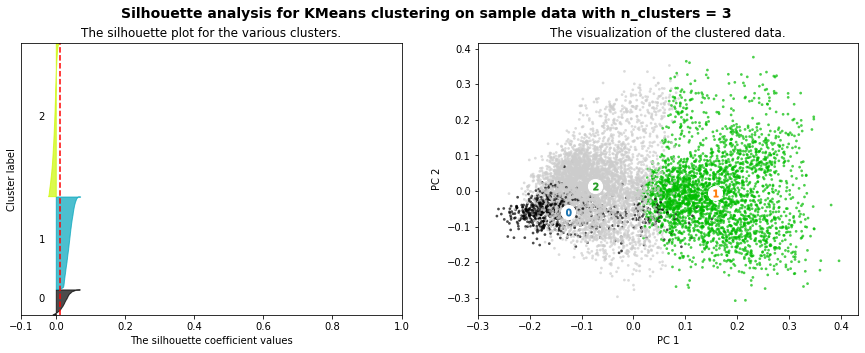

For n_clusters = 3, The average silhouette_score is : 0.012


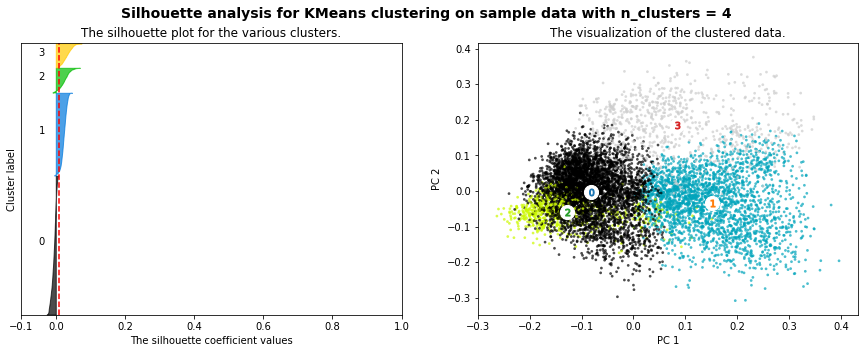

For n_clusters = 4, The average silhouette_score is : 0.009


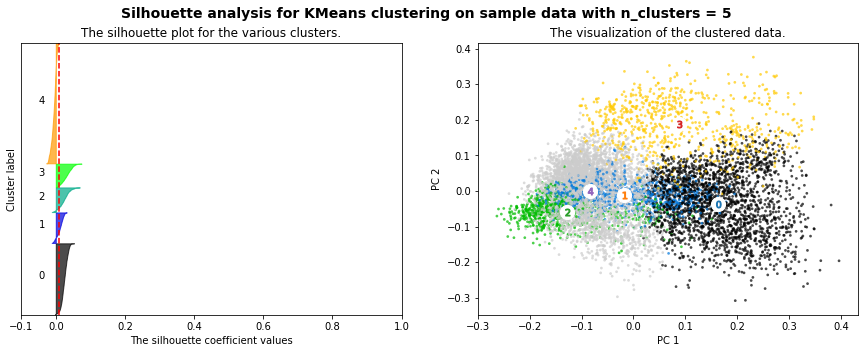

For n_clusters = 5, The average silhouette_score is : 0.010


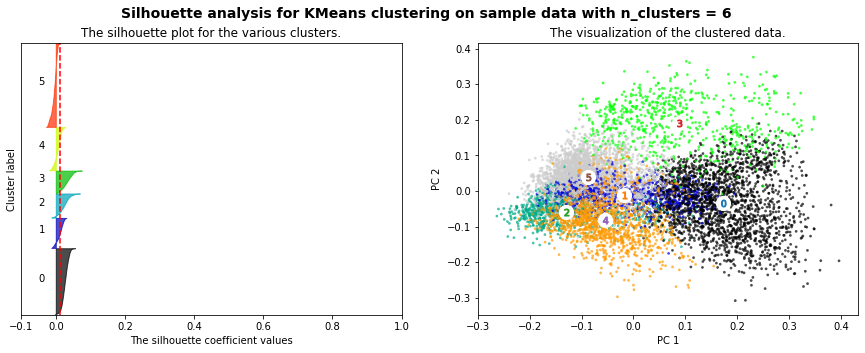

For n_clusters = 6, The average silhouette_score is : 0.011


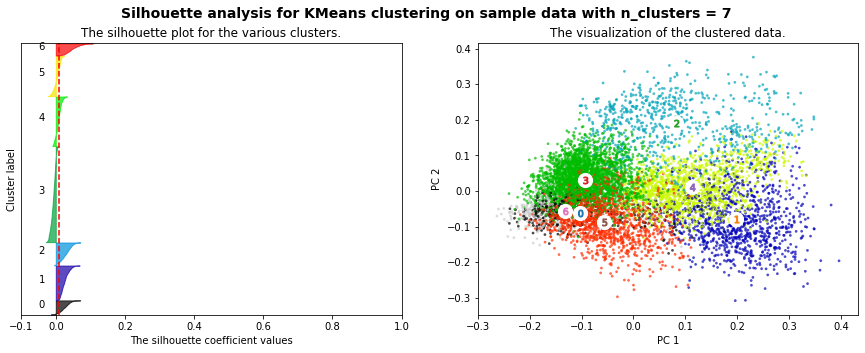

For n_clusters = 7, The average silhouette_score is : 0.008


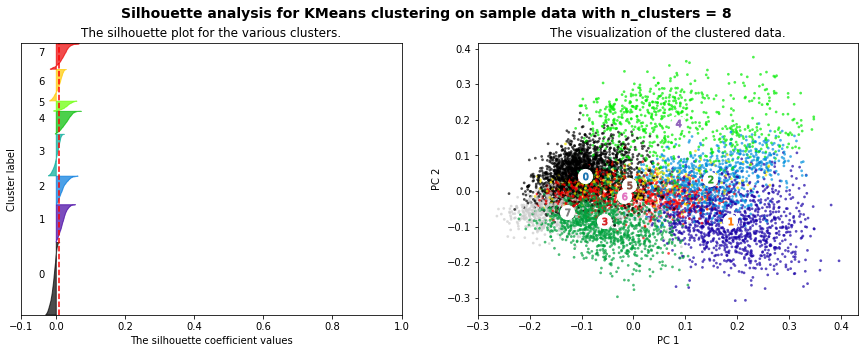

For n_clusters = 8, The average silhouette_score is : 0.009


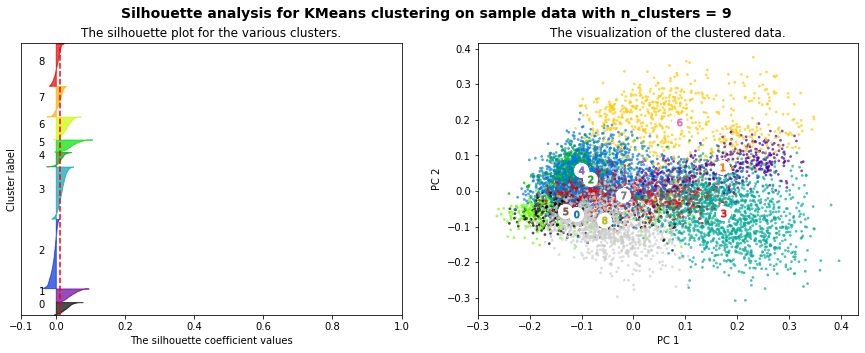

For n_clusters = 9, The average silhouette_score is : 0.011


In [94]:
# try different number of clusters
%matplotlib inline
silhouette_avg_list = []
for num in range(3, 10):
    X = tfidf_vects.toarray()
    silhouette_avg_list.append(plotSilhouette(num, X, tfidf_vects_pca_to2d))

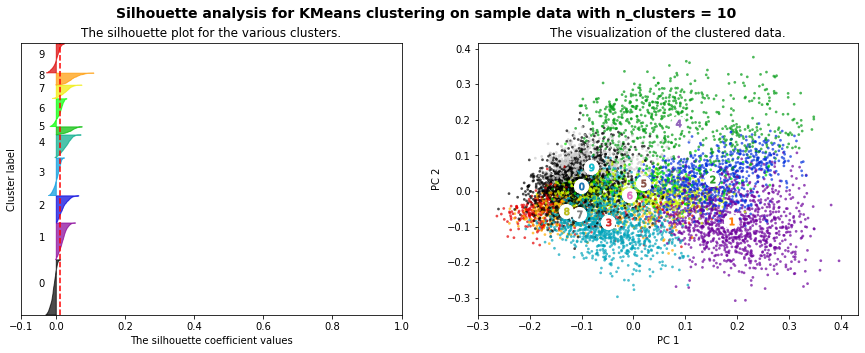

For n_clusters = 10, The average silhouette_score is : 0.011


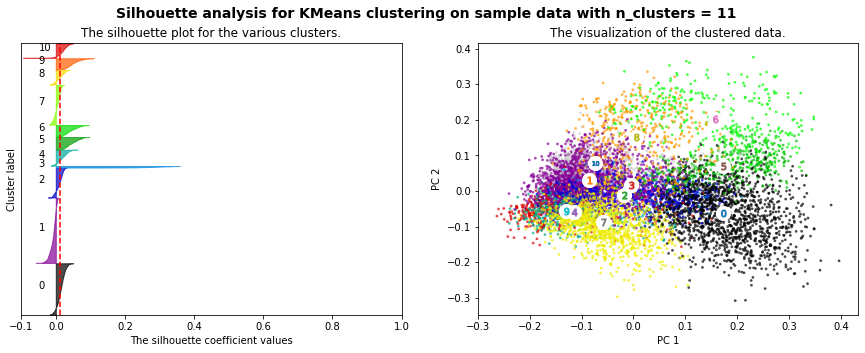

For n_clusters = 11, The average silhouette_score is : 0.013


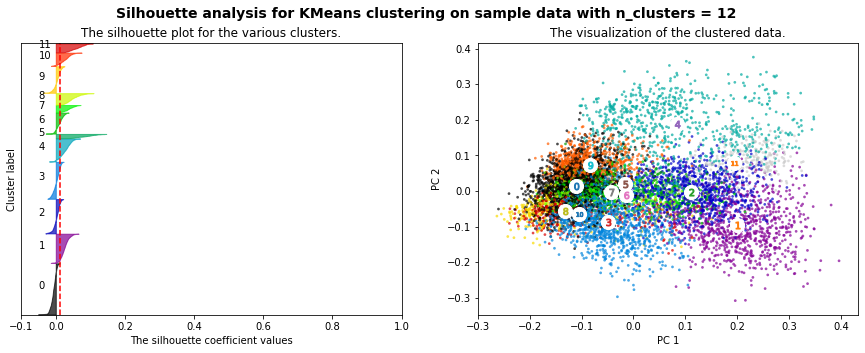

For n_clusters = 12, The average silhouette_score is : 0.013


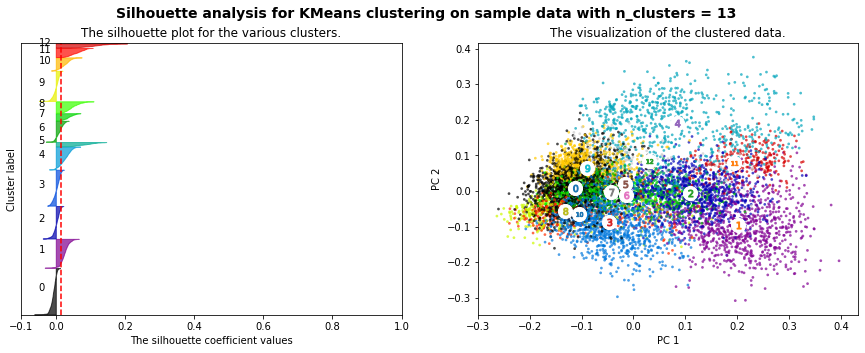

For n_clusters = 13, The average silhouette_score is : 0.014


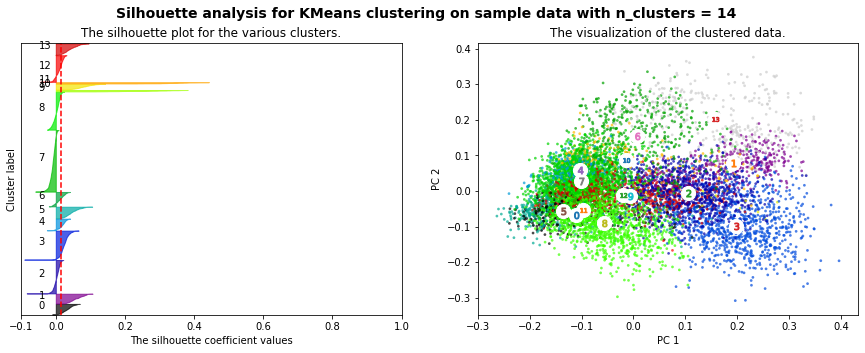

For n_clusters = 14, The average silhouette_score is : 0.015


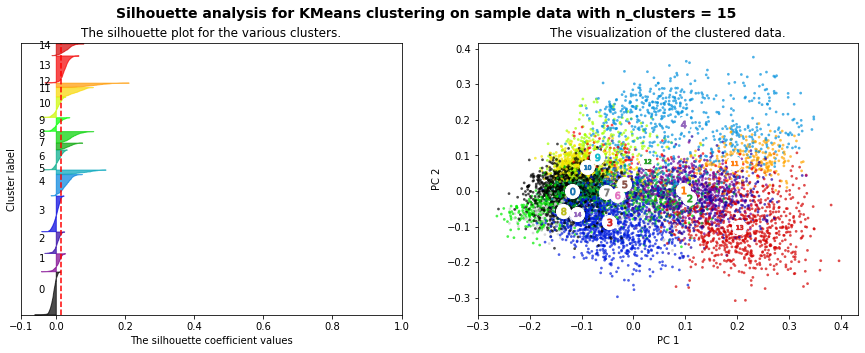

For n_clusters = 15, The average silhouette_score is : 0.015


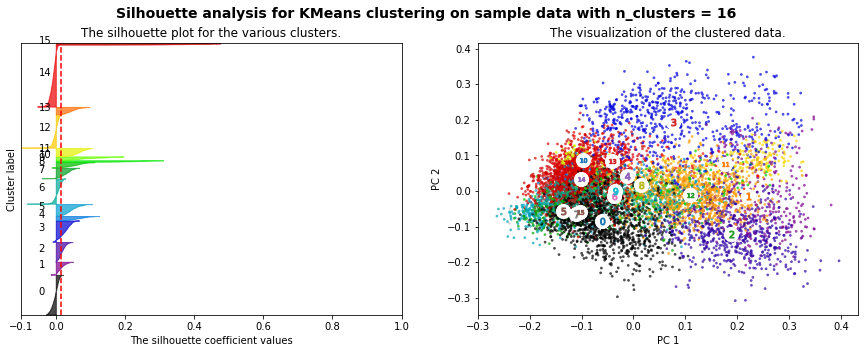

For n_clusters = 16, The average silhouette_score is : 0.014


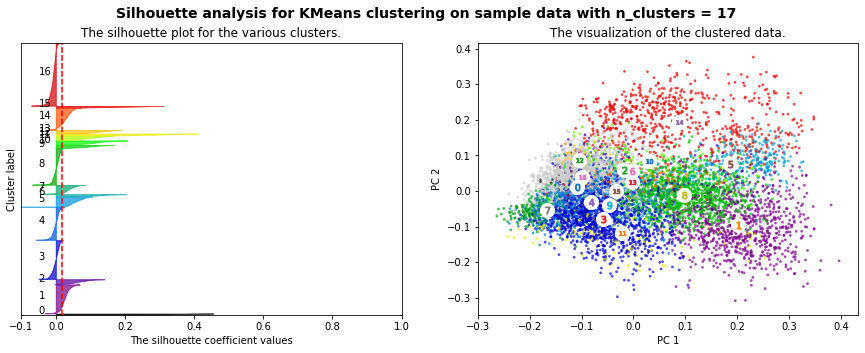

For n_clusters = 17, The average silhouette_score is : 0.018


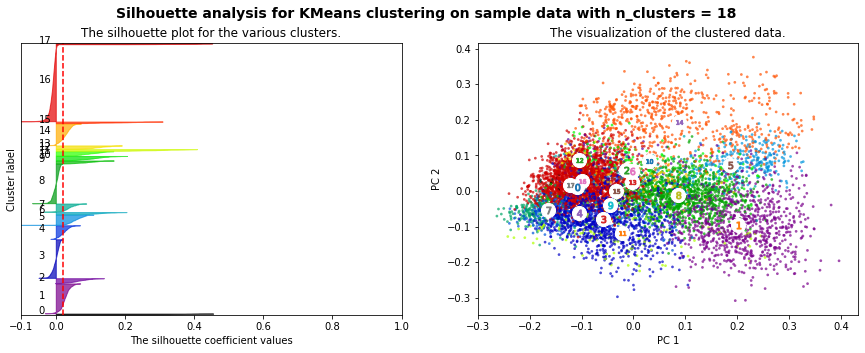

For n_clusters = 18, The average silhouette_score is : 0.020


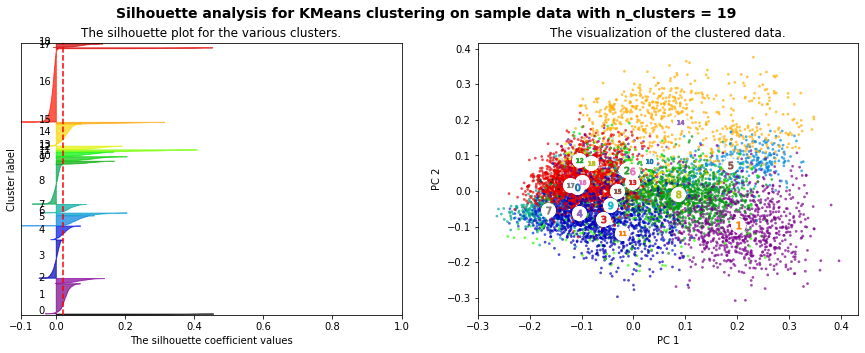

For n_clusters = 19, The average silhouette_score is : 0.021


In [97]:
# try different number of clusters
for num in range(10, 20):
    X = tfidf_vects.toarray()
    silhouette_avg_list.append(plotSilhouette(num, X, tfidf_vects_pca_to2d))

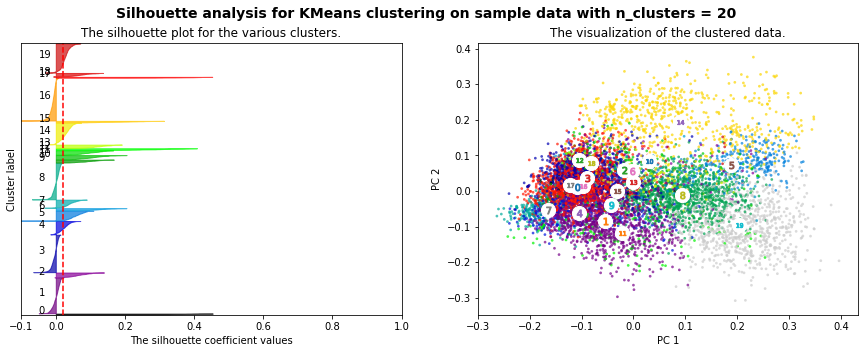

For n_clusters = 20, The average silhouette_score is : 0.022


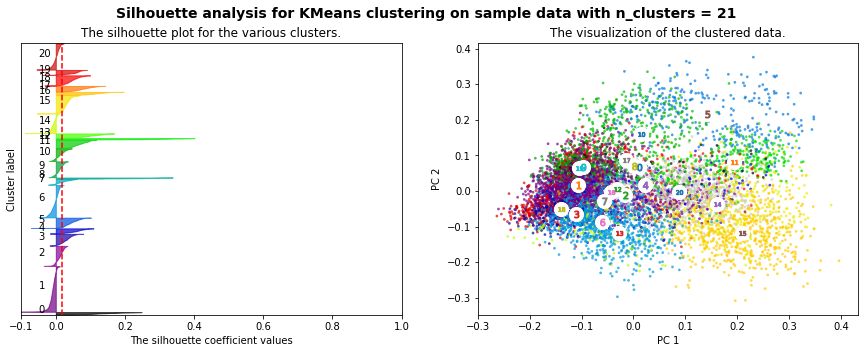

For n_clusters = 21, The average silhouette_score is : 0.019


In [ ]:
# try different number of clusters
for num in range(20, 30):
    X = tfidf_vects.toarray()
    silhouette_avg_list.append(plotSilhouette(num, X, tfidf_vects_pca_to2d))

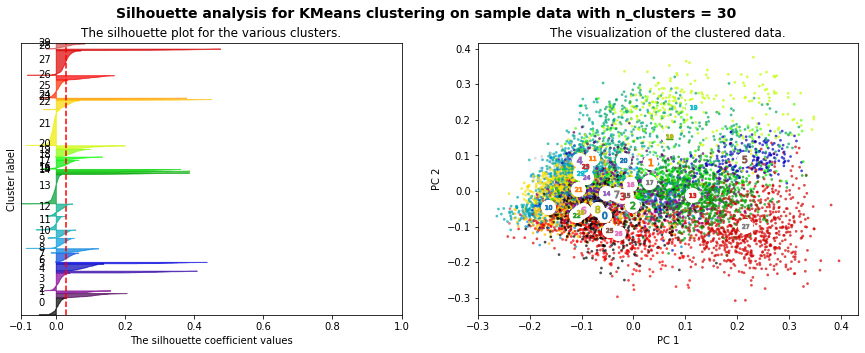

For n_clusters = 30, The average silhouette_score is : 0.029


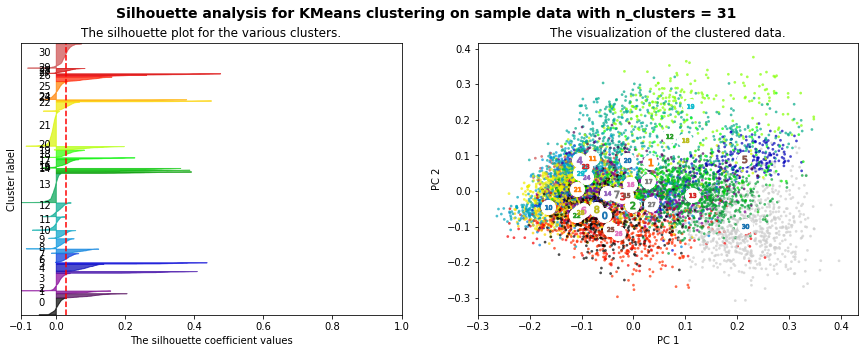

For n_clusters = 31, The average silhouette_score is : 0.029


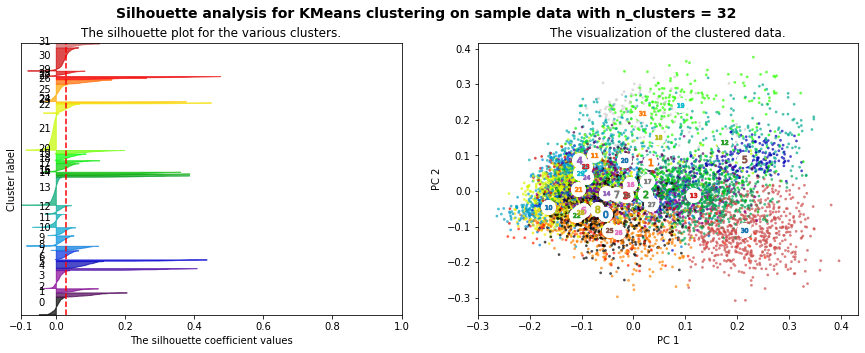

For n_clusters = 32, The average silhouette_score is : 0.029


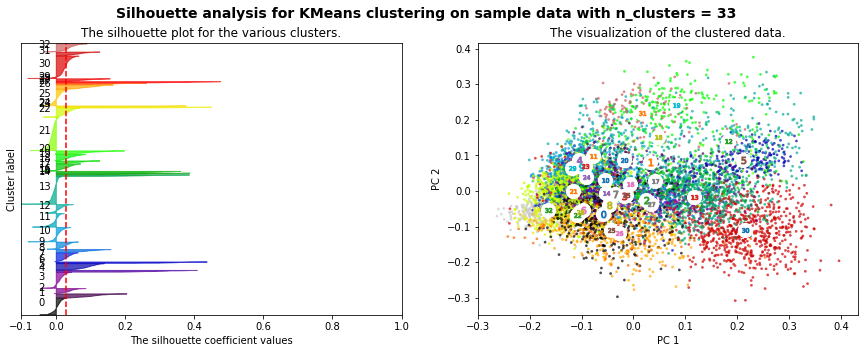

For n_clusters = 33, The average silhouette_score is : 0.030


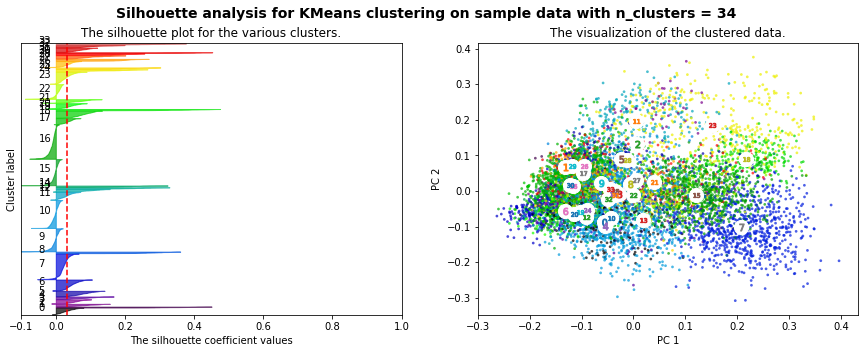

For n_clusters = 34, The average silhouette_score is : 0.033


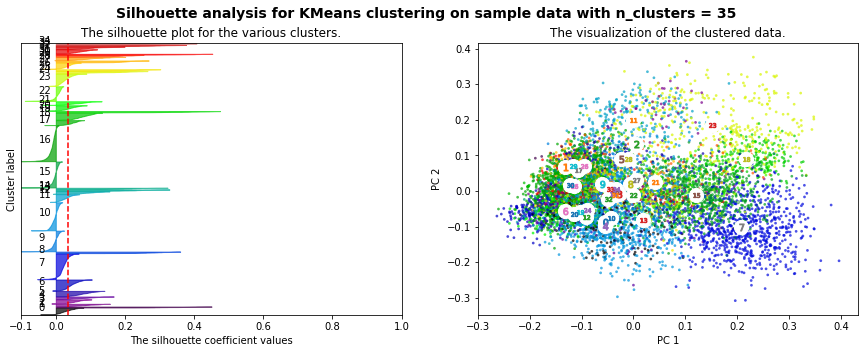

For n_clusters = 35, The average silhouette_score is : 0.034


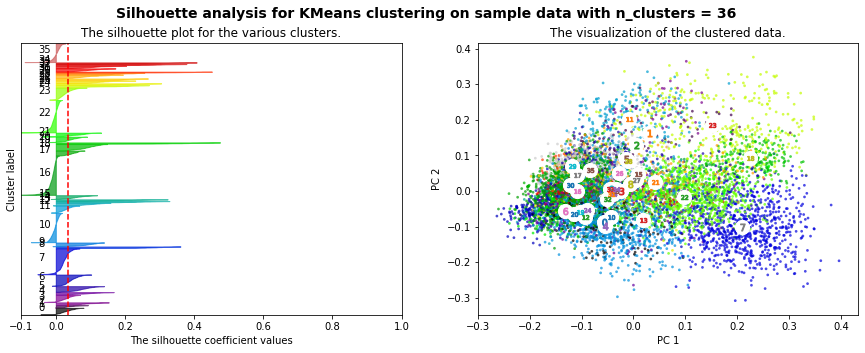

For n_clusters = 36, The average silhouette_score is : 0.035


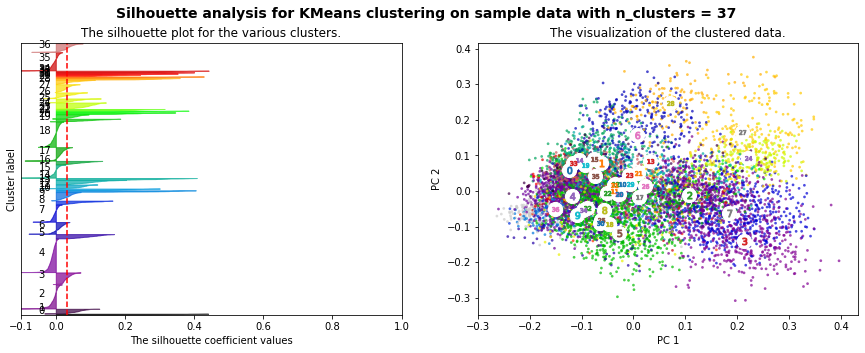

For n_clusters = 37, The average silhouette_score is : 0.032


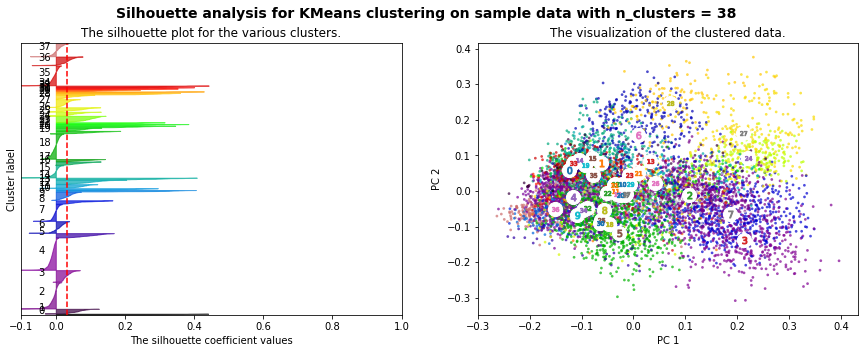

For n_clusters = 38, The average silhouette_score is : 0.032


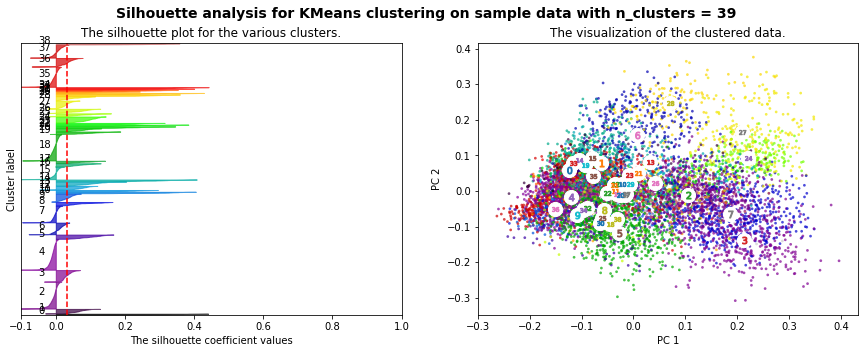

For n_clusters = 39, The average silhouette_score is : 0.033


In [103]:
# try different number of clusters
for num in range(30, 40):
    X = tfidf_vects.toarray()
    silhouette_avg_list.append(plotSilhouette(num, X, tfidf_vects_pca_to2d))

<IPython.core.display.Javascript object>


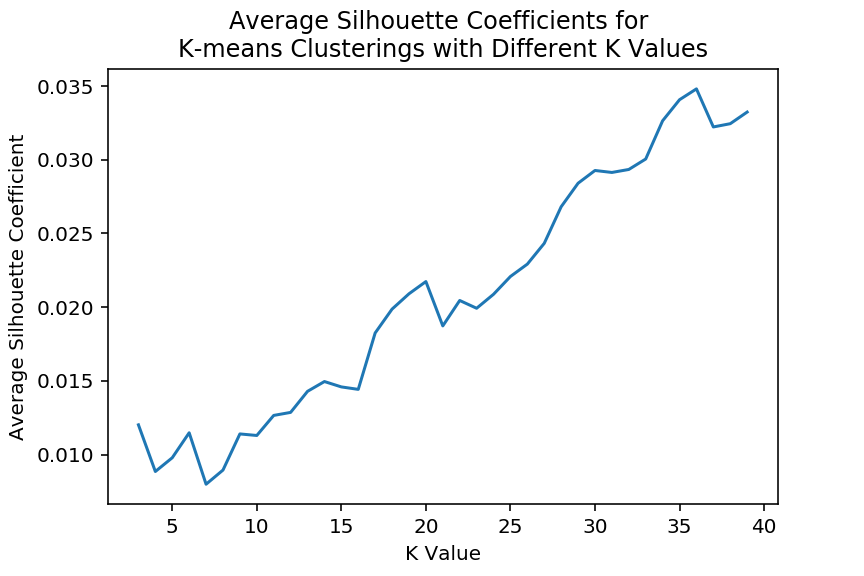

In [108]:
fig, ax = plt.subplots()
plt.plot(np.arange(3, 40), np.array(silhouette_avg_list))
# ax.xaxis.set_major_locator(MaxNLocator(integer=True, steps=[1, 2, 10], min_n_ticks=5))
# ax.set_xlim(1, 20)
plt.title('Average Silhouette Coefficients for \nK-means Clusterings with Different K Values')
plt.ylabel('Average Silhouette Coefficient')
plt.xlabel('K Value')
plt.show()

# Word embeddings: word2vec

In [6]:
# tokenize and normalize sentences (without lemmanization)
ungdc_df['text_tokenized_sents'] = ungdc_df['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
print('Complete tokenization. ')
ungdc_df['text_normalized_sents'] = ungdc_df['text_tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s, lemma=False) for s in x])
print('Complete normalization. ')

Complete tokenization. 
Complete normalization. 


In [9]:
# perform word2vec
ungdc_w2v = gensim.models.word2vec.Word2Vec(ungdc_df['text_normalized_sents'].sum())
ungdc_w2v.save('ungdc_w2v')

In [21]:
# to get all the vectors in the semantic space
# ungdc_w2v.wv.syn0

# to map from the matrix to the words
# ungdc_w2v.wv.index2word

# to get the most similar words of a word (cosine similarity)
# ungdc_w2v.most_similar('economic')

# to find which word least matches the others within a word set (cosine similarity)
ungdc_w2v.doesnt_match(['terrorism', 'military', 'security', 'war', 'climate'])

# to find which word best mathes the result of a semantic vector operation
# ungdc_w2v.most_similar(positive=['europe', 'china'], negative = ['kingdom'])

'climate'

In [108]:
ungdc_w2v.most_similar('economic')

[('socioeconomic', 0.6000857353210449),
 ('macroeconomic', 0.5258798003196716),
 ('economy', 0.5122213363647461),
 ('economies', 0.4857405424118042),
 ('developmental', 0.48108983039855957),
 ('development', 0.4735764265060425),
 ('structural', 0.4650611877441406),
 ('institutional', 0.4638729691505432),
 ('accelerated', 0.4632902145385742),
 ('industrialization', 0.4622102379798889)]

In [109]:
ungdc_w2v.most_similar('political')

[('institutional', 0.4763111174106598),
 ('geopolitical', 0.4571409821510315),
 ('politico', 0.4511909484863281),
 ('civic', 0.4227740168571472),
 ('broad', 0.41637757420539856),
 ('genuine', 0.4083988666534424),
 ('encompassing', 0.4018934667110443),
 ('necessarily', 0.3971408009529114),
 ('cultural', 0.3955113887786865),
 ('order', 0.38810020685195923)]

In [110]:
ungdc_w2v.most_similar('socialism')

[('communism', 0.6617789268493652),
 ('revolution', 0.6602495908737183),
 ('militarism', 0.6465303897857666),
 ('fascism', 0.6459265947341919),
 ('modernity', 0.6417255997657776),
 ('irreversibly', 0.6405586004257202),
 ('totalitarian', 0.6112449765205383),
 ('democracy', 0.6029049158096313),
 ('revolutions', 0.599818229675293),
 ('liberal', 0.5978608727455139)]

In [45]:
# american - america = korea - korean
ungdc_w2v.most_similar(positive=['american', 'korea'], negative = ['america'])

[('korean', 0.6539453268051147),
 ('german', 0.5409729480743408),
 ('china', 0.4914822578430176),
 ('koreans', 0.49019551277160645),
 ('koreas', 0.47762179374694824),
 ('tyrolean', 0.4762216806411743),
 ('slovak', 0.46717384457588196),
 ('mongolian', 0.4527764320373535),
 ('germanys', 0.44953209161758423),
 ('lao', 0.4462662935256958)]

In [ ]:
ungdc_w2v.most_similar(positive=['oppose', 'welcome'], negative = ['support'])

In [101]:
# islamabad - pakistan = bangkok - thailand
ungdc_w2v.most_similar(positive=['islamabad', 'thailand'], negative = ['pakistan'])

[('bangkok', 0.669387698173523),
 ('montevideo', 0.6646285057067871),
 ('dhaka', 0.6633561849594116),
 ('guadalajara', 0.6606460213661194),
 ('maseru', 0.6528457403182983),
 ('punta', 0.6495722532272339),
 ('sunday', 0.6480506658554077),
 ('kuala', 0.6464953422546387),
 ('lumpur', 0.6452121734619141),
 ('este', 0.6442561149597168)]

In [53]:
# reduce dimension to visualize the top 100 words with highest frequency

# get the top 100 words in terms of frequency 
# gensim.models.word2vec.Word2Vec sorts the vocabulary by descending frequency before assigning word indexes by default. 
numWords = 100
targetWords = ungdc_w2v.wv.index2word[:numWords]
wordsSubMatrix = []
for word in targetWords:
    wordsSubMatrix.append(ungdc_w2v[word])
wordsSubMatrix = np.array(wordsSubMatrix)

# First use PCA to decompose to 100 dimensions
w2v_vects_pca = sklearn.decomposition.PCA(n_components = numWords).fit_transform(wordsSubMatrix)
# T-SNE is theoretically better, but you should experiment
w2v_vects_tsne = sklearn.manifold.TSNE(n_components = 2).fit_transform(w2v_vects_pca)

In [ ]:
# About t-sne and pca. https://www.datacamp.com/community/tutorials/introduction-t-sne

# using PCA
# w2v_vects_pca = sklearn.decomposition.PCA(n_components = 2).fit_transform(ungdc_w2v.wv.syn0)


# using t-sne

# this is extremely time-consuming
# w2v_vects_tsne = sklearn.manifold.TSNE(n_components = 2).fit_transform(ungdc_w2v.wv.syn0)

# using multicore-tsne https://github.com/DmitryUlyanov/Multicore-TSNE
# w2v_vects_tsne = TSNE(n_jobs=4).fit_transform(ungdc_w2v.wv.syn0)


# @misc{Ulyanov2016,
#   author = {Ulyanov, Dmitry},
#   title = {Multicore-TSNE},
#   year = {2016},
#   publisher = {GitHub},
#   journal = {GitHub repository},
#   howpublished = {\url{https://github.com/DmitryUlyanov/Multicore-TSNE}},
# }

# @article{van2014accelerating,
#   title={Accelerating t-SNE using tree-based algorithms},
#   author={Van Der Maaten, Laurens},
#   journal={The Journal of Machine Learning Research},
#   volume={15},
#   number={1},
#   pages={3221--3245},
#   year={2014},
#   publisher={JMLR. org}
# }

<IPython.core.display.Javascript object>


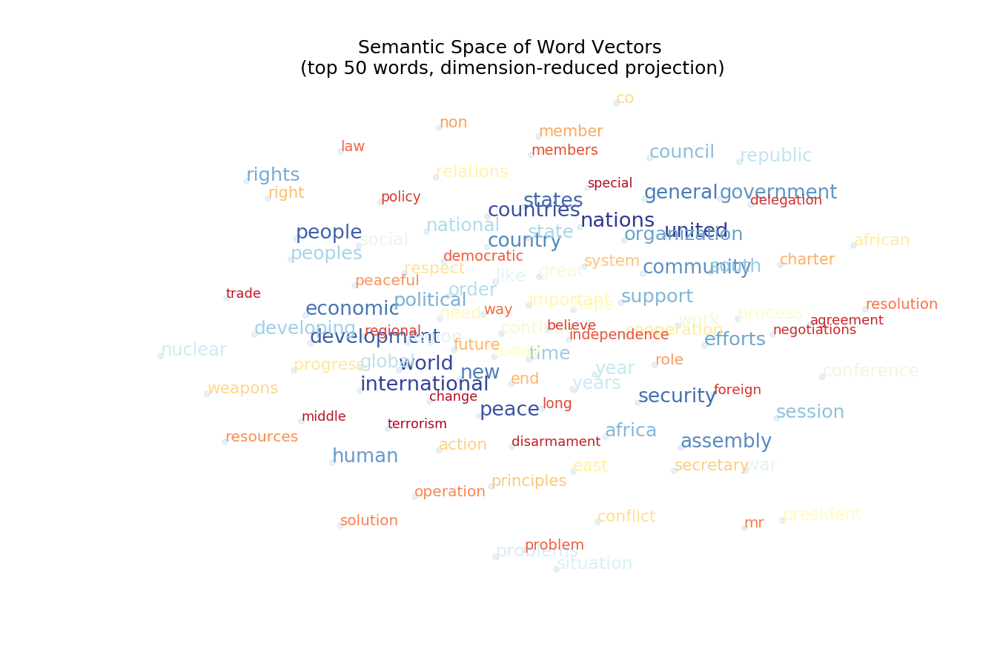

In [113]:
# Plot the result of TSNE
fig = plt.figure(figsize = (15,10))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(w2v_vects_tsne[:, 0], w2v_vects_tsne[:, 1], alpha = 0.1)
cmap = matplotlib.cm.get_cmap("RdYlBu")
for i, word in enumerate(targetWords):
    ax.annotate(word, (w2v_vects_tsne[:, 0][i], w2v_vects_tsne[:, 1][i]), size =  20 * np.log(2 + (numWords - i) / numWords), color=cmap((numWords - i) / numWords))
plt.xticks(())
plt.yticks(())
plt.title('Semantic Space of Word Vectors \n(top 50 words, dimension-reduced projection)', size=20)
plt.show()

# Word embeddings: doc2vec

In [19]:
# tokenize and normalize words (without lemmanization)
ungdc_df['text_tokenized_words'] = ungdc_df['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
ungdc_df['text_normalized_words_not_lem'] = ungdc_df['text_tokenized_words'].apply(lambda x: lucem_illud_2020.normalizeTokens(x, lemma=False))

In [924]:
NATO = ['USA', 'CAN', 'BEL', 'FRA', 'LUX', 'NLD', 'GBR', 'DNK', 'ISL', 'PRT', 'GRC', 'TUR', 'DEU', 'ESP']
WTO = ['RUS', 'ALB', 'BGR', 'CSK', 'DDR', 'HUN', 'POL', 'ROU']
cold_years = [str(year) for year in range(1970, 1992)]

In [974]:
# Tag the documents 

tagged_docs = []

for index, row in ungdc_df.iterrows(): 
    
    if row['year'] in cold_years : 
        doc_keywords = [row['country_code'] + '_' + row['year'], 
                        row['country_code'], 
                        row['year'], 
                        row['country_code'] + '_' + row['year'] + '_cold', 
                        row['country_code'] + '_cold', 
                        row['year'] + '_cold']
        if row['country_code'] in NATO: 
            doc_keywords.append('NATO')
            doc_keywords.append('NATO_cold')
        elif row['country_code'] in WTO: 
            doc_keywords.append('WTO')
            doc_keywords.append('WTO_cold')
    else: 
        doc_keywords = [row['country_code'] + '_' + row['year'], 
                        row['country_code'], 
                        row['year']]
    

    tagged_docs.append(gensim.models.doc2vec.LabeledSentence(words = row['text_normalized_words_not_lem'], 
                                                            tags = doc_keywords))
ungdc_df['tagged_text'] = tagged_docs

In [975]:
# perform doc2vec
ungdc_d2v = gensim.models.doc2vec.Doc2Vec(ungdc_df['tagged_text'])
ungdc_d2v.save('ungdc_d2v')

In [976]:
# documents are actually the centroids (high dimensional average points) of their words.
ungdc_d2v['USA_2015']

array([ 0.2741614 ,  0.8734259 , -0.33351058,  0.01439544,  0.06092703,
       -0.14543846, -0.04462995,  0.08125947, -0.7353689 ,  0.16850045,
        0.81816775, -0.53200877,  0.3763324 ,  0.3522138 ,  0.10866402,
       -0.5576225 ,  0.07925501, -0.06500696,  0.2622963 , -0.64036393,
       -0.19559386,  0.19731428,  1.0099382 , -0.44562778, -0.0161735 ,
       -0.22355403,  0.09395397,  0.28674504, -0.6026741 , -0.72262543,
       -0.47574204, -0.5613245 , -0.23109598,  0.24173965, -0.5777728 ,
        0.2505453 , -0.1022554 , -0.19574635, -0.08221205, -0.40449804,
        0.0185295 , -0.0219712 ,  0.03089703, -0.01446134,  0.15020466,
       -0.06088804,  0.08790899,  0.60996234, -0.2651865 , -0.1361039 ,
       -0.17658886, -0.04380065, -0.5734268 , -0.30947617, -0.26834714,
        0.30704424,  0.323235  , -0.5442411 , -0.51662254, -0.08356535,
       -0.8620106 ,  0.5250046 , -0.65974784, -0.65817434,  0.04960843,
       -0.700186  ,  0.5747292 , -0.12025652,  0.3708582 ,  0.36

In [977]:
ungdc_d2v['2015']

array([ 0.8371655 ,  1.7717369 ,  0.16959548,  4.6666884 , -0.5637837 ,
       -1.2832074 , -1.8798606 ,  1.6257395 ,  0.02125501, -0.3064298 ,
       -0.3421195 ,  1.1541055 , -0.23894502,  0.611179  ,  0.43988883,
       -0.83628196, -0.01047313, -0.04293248, -1.2964253 , -0.04851156,
       -1.5674721 , -0.77675205, -0.37753224, -2.6970448 ,  0.1273173 ,
        0.8732038 ,  1.0944084 ,  0.91120696,  0.920988  , -1.2592472 ,
       -1.4579026 ,  0.75312746,  0.31378388,  0.42946288,  0.25442356,
        1.5399212 ,  1.2927479 , -0.04802431, -0.90300506,  0.22561514,
        0.21292351, -0.17744038,  0.9938452 , -0.18718745,  0.06811249,
       -0.6591917 ,  0.6711084 ,  0.554433  ,  1.7289572 ,  0.43477863,
        1.027642  , -1.3643419 ,  1.209188  ,  1.1920792 , -2.286776  ,
        0.9579724 ,  2.1858037 ,  2.1204953 ,  1.5013673 , -0.2300664 ,
       -1.478762  , -0.06936128,  0.7467323 ,  0.42924955,  1.6472291 ,
        1.0647436 , -2.5743015 ,  0.15821657, -0.4968161 , -0.68

In [981]:
# pairwise cosine similarity
print('cos(USA, CHN): ', float(sklearn.metrics.pairwise.cosine_similarity(ungdc_d2v['USA'].reshape(1, -1), ungdc_d2v['CHN'].reshape(1, -1))))
print('cos(USA, GBR): ', float(sklearn.metrics.pairwise.cosine_similarity(ungdc_d2v['USA'].reshape(1, -1), ungdc_d2v['GBR'].reshape(1, -1))))
print('cos(USA, WTO): ', float(sklearn.metrics.pairwise.cosine_similarity(ungdc_d2v['USA'].reshape(1, -1), ungdc_d2v['WTO'].reshape(1, -1))))
print('cos(RUS, WTO): ', float(sklearn.metrics.pairwise.cosine_similarity(ungdc_d2v['RUS'].reshape(1, -1), ungdc_d2v['WTO'].reshape(1, -1))))

cos(USA, CHN):  0.16825255751609802
cos(USA, GBR):  0.7554042339324951
cos(USA, WTO):  -0.06394949555397034
cos(RUS, WTO):  0.6559388637542725


In [982]:
# the countries that are most similar to USA
ungdc_d2v.docvecs.most_similar('USA')

[('GBR', 0.7554041743278503),
 ('CAN', 0.7046635150909424),
 ('ISR', 0.6608715057373047),
 ('AUS', 0.624266505241394),
 ('NOR', 0.5043017864227295),
 ('NZL', 0.49941685795783997),
 ('NLD', 0.4783184826374054),
 ('SGP', 0.4782664179801941),
 ('CHL_1989_cold', 0.4755556881427765),
 ('MYS_2013', 0.4747663140296936)]

In [983]:
# the countries that are most similar to CHN
ungdc_d2v.docvecs.most_similar('CHN')

[('VNM', 0.678825318813324),
 ('PRK', 0.5692214965820312),
 ('CHN_cold', 0.5655956268310547),
 ('KHM_1978', 0.5319859981536865),
 ('KHM_1978_cold', 0.531752347946167),
 ('VNM_cold', 0.5280090570449829),
 ('CHN_1977', 0.521519124507904),
 ('CHN_1977_cold', 0.5201141834259033),
 ('LAO', 0.4816164970397949),
 ('CHN_1998', 0.47981029748916626)]

In [984]:
# the countries that are most similar to RUS
ungdc_d2v.docvecs.most_similar('RUS')

[('BLR', 0.8557981252670288),
 ('UKR', 0.8514611124992371),
 ('KAZ', 0.7636085748672485),
 ('CSK', 0.7437402009963989),
 ('UZB', 0.7382171154022217),
 ('MNG_cold', 0.6964465379714966),
 ('TKM', 0.6931227445602417),
 ('CSK_cold', 0.6753487586975098),
 ('KGZ', 0.6646099090576172),
 ('WTO', 0.655938982963562)]

In [985]:
ungdc_d2v.docvecs.most_similar('JPN')

[('KOR', 0.5920199155807495),
 ('JPN_cold', 0.5811690092086792),
 ('THA', 0.5203973054885864),
 ('PRK_2007', 0.4883900284767151),
 ('VNM', 0.43562978506088257),
 ('IDN_1974_cold', 0.41375648975372314),
 ('IDN_1974', 0.4122493863105774),
 ('PRK', 0.4079180359840393),
 ('BRN', 0.4076821208000183),
 ('KHM', 0.40669727325439453)]

In [986]:
ungdc_d2v.docvecs.most_similar('2000')

[('1999', 0.9587112069129944),
 ('2005', 0.9242832660675049),
 ('1998', 0.9190384149551392),
 ('1997', 0.9137094020843506),
 ('2004', 0.9122642278671265),
 ('1996', 0.9097183346748352),
 ('2002', 0.9047397375106812),
 ('2006', 0.8996289968490601),
 ('2007', 0.8992949724197388),
 ('2003', 0.8962002396583557)]

In [991]:
ungdc_d2v.docvecs.most_similar('USA_2000')

[('JPN_1976', 0.4295293092727661),
 ('JPN_1976_cold', 0.42930662631988525),
 ('DMA_1992', 0.38516831398010254),
 ('BGR_2002', 0.3787536919116974),
 ('CZE_1994', 0.37701869010925293),
 ('NLD_1984_cold', 0.37316566705703735),
 ('NLD_1984', 0.371900737285614),
 ('LSO_2007', 0.3469034433364868),
 ('MDV_2013', 0.34442418813705444),
 ('GBR_1980_cold', 0.33963775634765625)]

### Pairwise consine similarities over year

In [168]:
# Plot a heatmap of pairwise cosine

# the top 20 nations in terms of GDP
# https://www.imf.org/external/Datamapper/NGDPD@WEO/OEMDC/ADVEC/WEOWORLD
targets = ['USA', 'CHN', 'JPN', 'DEU', 'IND', 
           'FRA', 'GBR', 'ITA', 'BRA', 'CAN', 
           'KOR', 'ESP', 'AUS', 'MEX', 'IDN', 
           'NLD', 'TUR', 'SAU', 'CHE', 'POL']


heatmapMatrix = []
for tagOuter in targets:
    column = []
    tagVec = ungdc_d2v.docvecs[tagOuter].reshape(1, -1)
    for tagInner in targets:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, ungdc_d2v.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrix.append(column)
heatmapMatrix = np.array(heatmapMatrix)

<IPython.core.display.Javascript object>


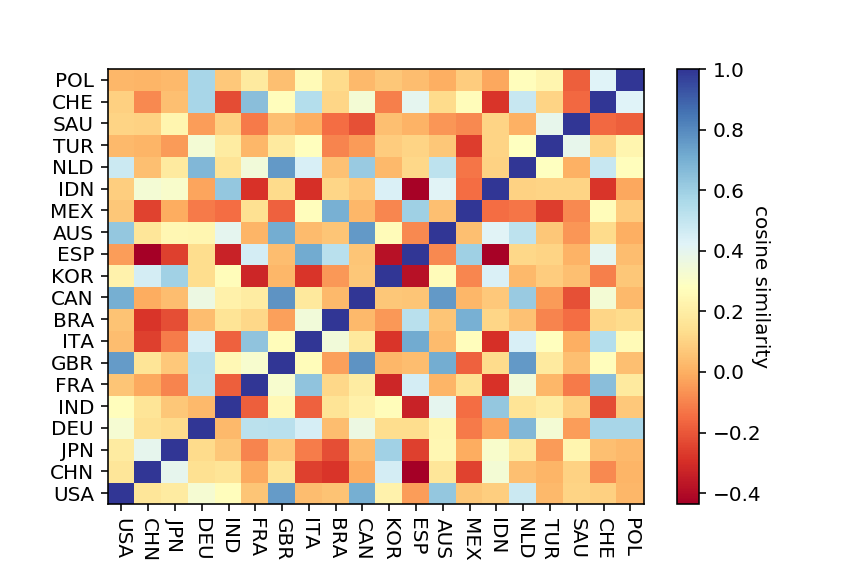

In [169]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrix, cmap='RdYlBu')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(targets, minor=False, rotation=270)
a = ax.set_yticklabels(targets, minor=False)

# plt.title('Pairwise Cosine Similarities of 20 Nations (1970-2018)')

<IPython.core.display.Javascript object>


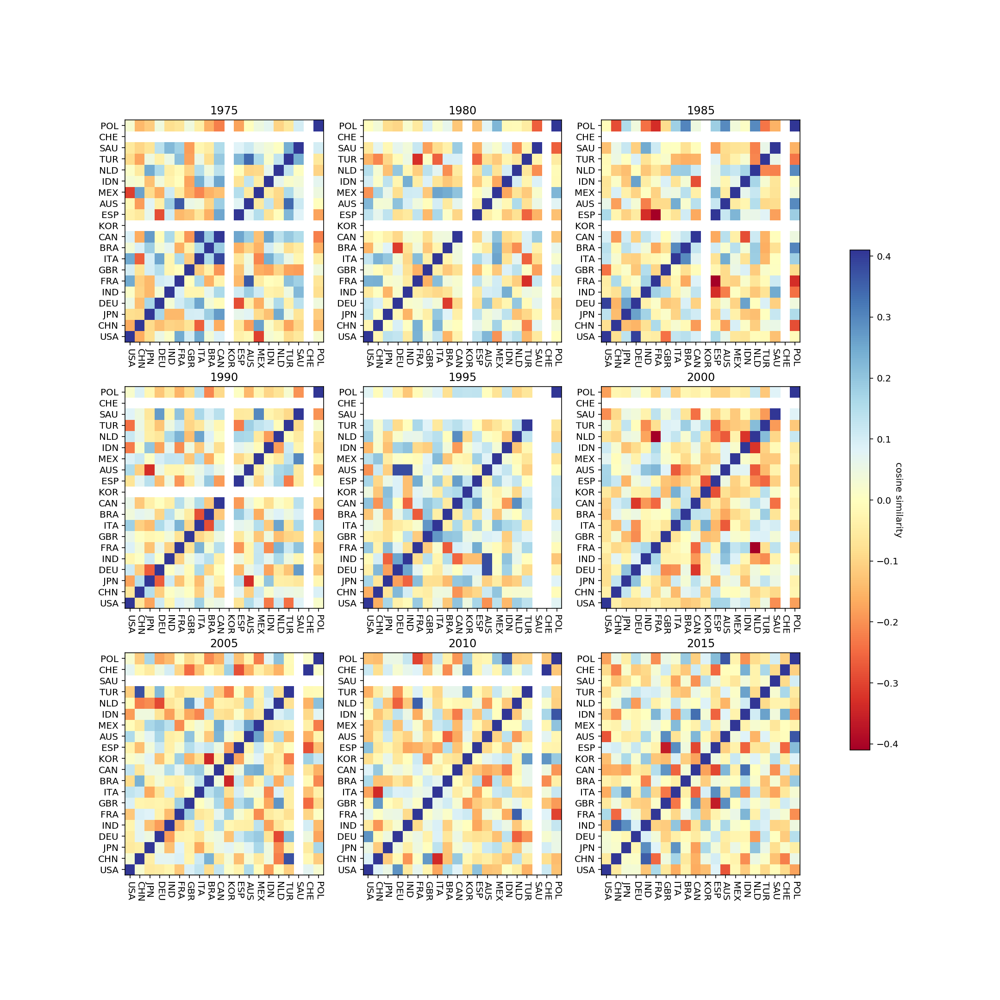

In [178]:
# Plot a heatmap of pairwise cosine over years

targets = ['USA', 'CHN', 'JPN', 'DEU', 'IND', 
           'FRA', 'GBR', 'ITA', 'BRA', 'CAN', 
           'KOR', 'ESP', 'AUS', 'MEX', 'IDN', 
           'NLD', 'TUR', 'SAU', 'CHE', 'POL']

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for ax, year in zip(axs.flatten(), [year for year in range(1975, 2016, 5)]): 
#     print(ax)
    targets_list = [code + '_' + str(year) for code in targets]

    heatmapMatrix = []
    for tagOuter in targets_list:
            column = []
            try: 
                tagVec = ungdc_d2v.docvecs[tagOuter].reshape(1, -1)
            except KeyError: 
                heatmapMatrix.append([np.nan] * len(targets_list))
                continue
            for tagInner in targets_list: 
                try: 
                    column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, ungdc_d2v.docvecs[tagInner].reshape(1, -1))[0][0])
                except KeyError: 
                    column.append(np.nan)
            heatmapMatrix.append(column)

    heatmapMatrix = np.array(heatmapMatrix)
    
    hmap = ax.pcolor(heatmapMatrix, cmap='RdYlBu', vmin=-0.41, vmax=0.41)
    
#     cbar.set_label('cosine similarity', rotation=270)
    ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
    ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

    ax.set_xticklabels(targets, minor=False, rotation=270)
    ax.set_yticklabels(targets, minor=False)
    
#     fig.colorbar(hmap, ax=ax)
    ax.set_title(year)
    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.5])
cbar = fig.colorbar(hmap, cax=cbar_ax)
cbar.set_label('cosine similarity', rotation=270)
# fig.suptitle('Pairwise Cosine Similarities of 20 Nations', size=30)

<IPython.core.display.Javascript object>


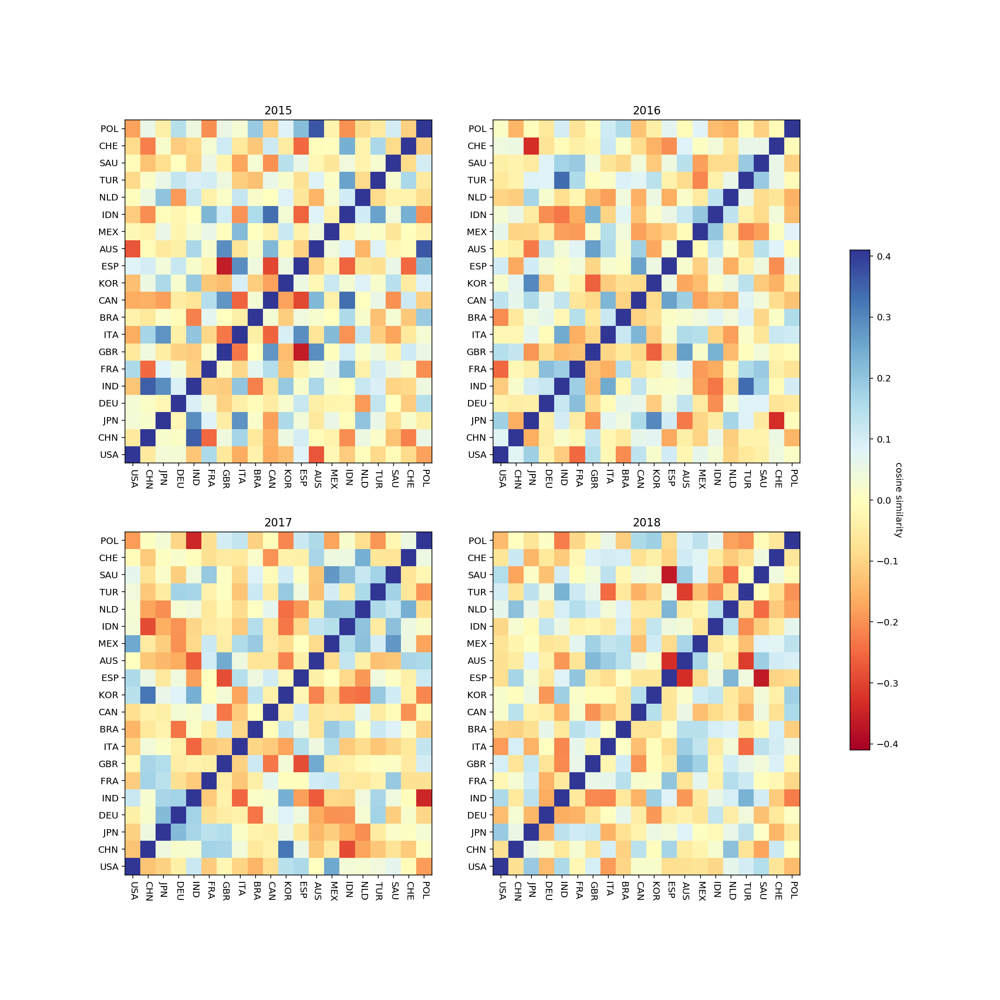

In [180]:
# Plot a heatmap of pairwise cosine for recent years

targets = ['USA', 'CHN', 'JPN', 'DEU', 'IND', 
           'FRA', 'GBR', 'ITA', 'BRA', 'CAN', 
           'KOR', 'ESP', 'AUS', 'MEX', 'IDN', 
           'NLD', 'TUR', 'SAU', 'CHE', 'POL']

fig, axs = plt.subplots(2, 2, figsize=(15, 15))

for ax, year in zip(axs.flatten(), [year for year in range(2015, 2019)]): 
#     print(ax)
    targets_list = [code + '_' + str(year) for code in targets]

    heatmapMatrix = []
    for tagOuter in targets_list:
            column = []
            try: 
                tagVec = ungdc_d2v.docvecs[tagOuter].reshape(1, -1)
            except KeyError: 
                heatmapMatrix.append([np.nan] * len(targets_list))
                continue
            for tagInner in targets_list: 
                try: 
                    column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, ungdc_d2v.docvecs[tagInner].reshape(1, -1))[0][0])
                except KeyError: 
                    column.append(np.nan)
            heatmapMatrix.append(column)

    heatmapMatrix = np.array(heatmapMatrix)
    
    hmap = ax.pcolor(heatmapMatrix, cmap='RdYlBu', vmin=-0.41, vmax=0.41)
    
#     cbar.set_label('cosine similarity', rotation=270)
    ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
    ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

    ax.set_xticklabels(targets, minor=False, rotation=270)
    ax.set_yticklabels(targets, minor=False)
    
#     fig.colorbar(hmap, ax=ax)
    ax.set_title(year)
    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.5])
cbar = fig.colorbar(hmap, cax=cbar_ax)
cbar.set_label('cosine similarity', rotation=270)
# fig.suptitle('Pairwise Cosine Similarities of 20 Nations in Recent Years', size=30)

<IPython.core.display.Javascript object>


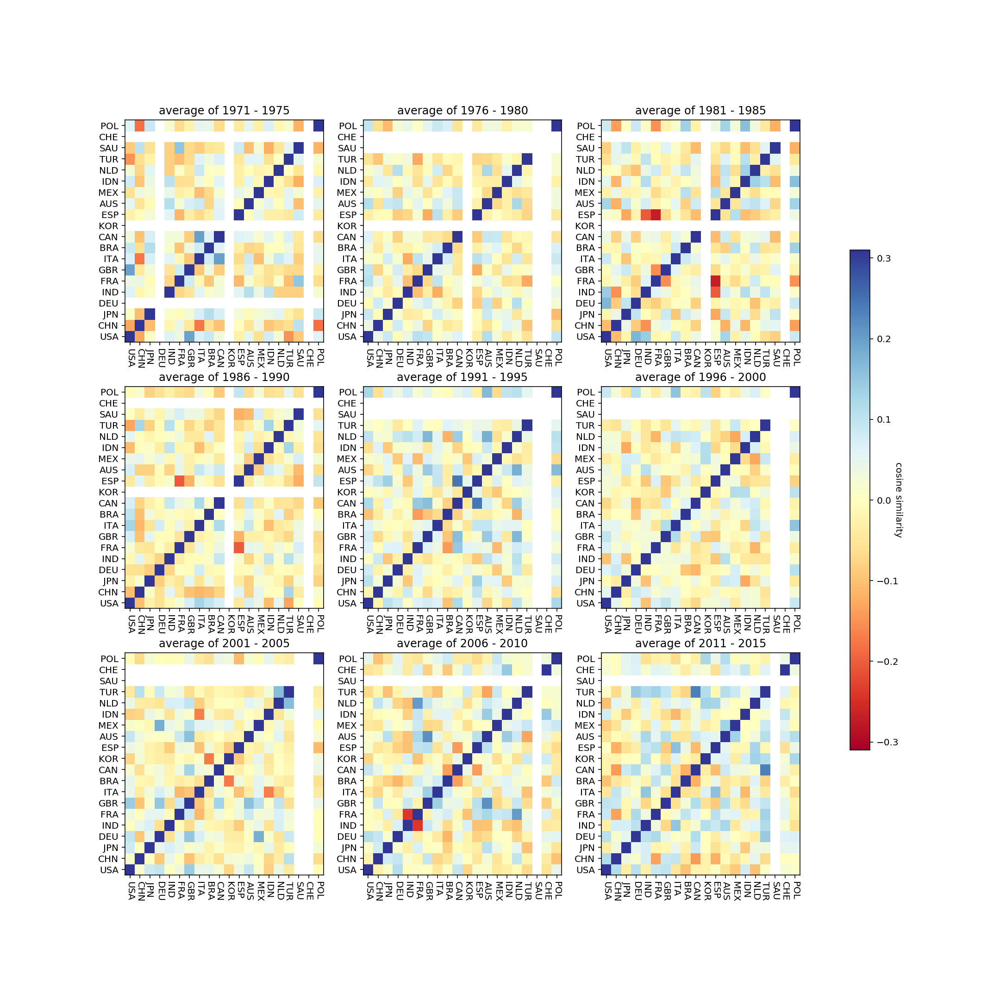

In [181]:
# Plot a heatmap of average pairwise cosine over every five years

targets = ['USA', 'CHN', 'JPN', 'DEU', 'IND', 
           'FRA', 'GBR', 'ITA', 'BRA', 'CAN', 
           'KOR', 'ESP', 'AUS', 'MEX', 'IDN', 
           'NLD', 'TUR', 'SAU', 'CHE', 'POL']

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
heatmapMatrix_dict = {}

for year in range(1970, 2019): 
#     print(year)
    targets_list = [code + '_' + str(year) for code in targets]

    heatmapMatrix_dict[year] = []
    for tagOuter in targets_list:
            column = []
            try: 
                tagVec = ungdc_d2v.docvecs[tagOuter].reshape(1, -1)
            except KeyError: 
                heatmapMatrix_dict[year].append([np.nan] * len(targets_list))
                continue
            for tagInner in targets_list: 
                try: 
                    column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, ungdc_d2v.docvecs[tagInner].reshape(1, -1))[0][0])
                except KeyError: 
                    column.append(np.nan)
            heatmapMatrix_dict[year].append(column)

    heatmapMatrix_dict[year] = np.array(heatmapMatrix_dict[year])
    

for ax, year in zip(axs.flatten(), [year for year in range(1975, 2016, 5)]): 
    
    heatmapMatrix_process = np.zeros(len(targets) ** 2)
    for i in range(len(targets) ** 2): 
        heatmapMatrix_process[i] = np.mean([heatmapMatrix_dict[check_year].flatten()[i] for check_year in range(year - 4, year + 1)])
    heatmapMatrix_toplot = heatmapMatrix_process.reshape(len(targets), len(targets))
    
    hmap = ax.pcolor(heatmapMatrix_toplot, cmap='RdYlBu', vmin=-0.31, vmax=0.31)
    
#     cbar.set_label('cosine similarity', rotation=270)
    ax.set_xticks(np.arange(heatmapMatrix_toplot.shape[1]) + 0.5, minor=False)
    ax.set_yticks(np.arange(heatmapMatrix_toplot.shape[0]) + 0.5, minor=False)

    ax.set_xticklabels(targets, minor=False, rotation=270)
    ax.set_yticklabels(targets, minor=False)
    
#     fig.colorbar(hmap, ax=ax)
    ax.set_title(f'average of {year-4} - {year}')

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.5])
cbar = fig.colorbar(hmap, cax=cbar_ax)
cbar.set_label('cosine similarity', rotation=270)
# fig.suptitle('Average Pairwise Cosine Similarities within Every 5 Years of 20 Nations', size=30)

<IPython.core.display.Javascript object>


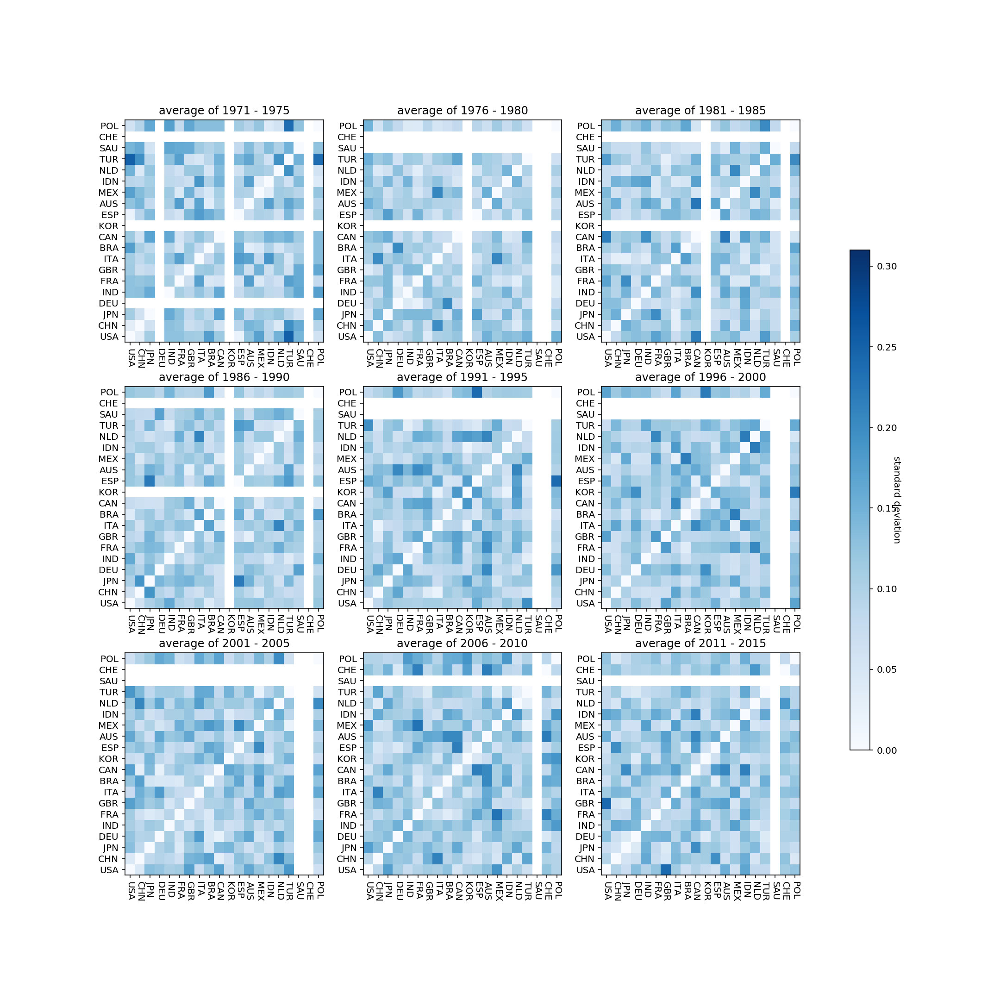

In [182]:
# Plot a heatmap of the standard deviation

targets = ['USA', 'CHN', 'JPN', 'DEU', 'IND', 
           'FRA', 'GBR', 'ITA', 'BRA', 'CAN', 
           'KOR', 'ESP', 'AUS', 'MEX', 'IDN', 
           'NLD', 'TUR', 'SAU', 'CHE', 'POL']

fig, axs = plt.subplots(3, 3, figsize=(15, 15))
heatmapMatrix_dict = {}

for year in range(1970, 2019): 
#     print(year)
    targets_list = [code + '_' + str(year) for code in targets]

    heatmapMatrix_dict[year] = []
    for tagOuter in targets_list:
            column = []
            try: 
                tagVec = ungdc_d2v.docvecs[tagOuter].reshape(1, -1)
            except KeyError: 
                heatmapMatrix_dict[year].append([np.nan] * len(targets_list))
                continue
            for tagInner in targets_list: 
                try: 
                    column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, ungdc_d2v.docvecs[tagInner].reshape(1, -1))[0][0])
                except KeyError: 
                    column.append(np.nan)
            heatmapMatrix_dict[year].append(column)

    heatmapMatrix_dict[year] = np.array(heatmapMatrix_dict[year])
    

for ax, year in zip(axs.flatten(), [year for year in range(1975, 2016, 5)]): 
    
    heatmapMatrix_process = np.zeros(len(targets) ** 2)
    for i in range(len(targets) ** 2): 
        heatmapMatrix_process[i] = np.std([heatmapMatrix_dict[check_year].flatten()[i] for check_year in range(year - 4, year + 1)])
    heatmapMatrix_toplot = heatmapMatrix_process.reshape(len(targets), len(targets))
    
    hmap = ax.pcolor(heatmapMatrix_toplot, cmap='Blues', vmin=0, vmax=0.31)
    
#     cbar.set_label('cosine similarity', rotation=270)
    ax.set_xticks(np.arange(heatmapMatrix_toplot.shape[1]) + 0.5, minor=False)
    ax.set_yticks(np.arange(heatmapMatrix_toplot.shape[0]) + 0.5, minor=False)

    ax.set_xticklabels(targets, minor=False, rotation=270)
    ax.set_yticklabels(targets, minor=False)
    
#     fig.colorbar(hmap, ax=ax)
    ax.set_title(f'average of {year-4} - {year}')

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.5])
cbar = fig.colorbar(hmap, cax=cbar_ax)
cbar.set_label('standard deviation', rotation=270)
# fig.suptitle('Standard Deviation of Cosine Similarities for Every 5 Years of 20 Nations', size=30)

In [1007]:
# d2v also embeds word vectors
ungdc_d2v.most_similar(positive=['rejects', 'welcomes'], negative = ['supports'])

[('opposes', 0.6259053945541382),
 ('denounces', 0.6240682601928711),
 ('condemns', 0.5906230211257935),
 ('repudiate', 0.5725674033164978),
 ('deplores', 0.5647983551025391),
 ('repudiated', 0.5476288795471191),
 ('opposed', 0.534343421459198),
 ('reject', 0.5339957475662231),
 ('rejecting', 0.5336370468139648),
 ('abhors', 0.5317601561546326)]

### Projection onto the cold war dimension

In [ ]:
# Use doc2vec trained on the full dataset. 

In [193]:
# # perform doc2vec using the 1970-1991 subset
target = ungdc_df[ungdc_df['year'].apply(lambda x: int(x)) < 1992]
# ungdc_d2v_1970_1991 = gensim.models.doc2vec.Doc2Vec(target['tagged_text'])
# ungdc_d2v_1970_1991.save('ungdc_d2v_1970-1991')

In [194]:
ungdc_d2v_1970_1991 = gensim.models.doc2vec.Doc2Vec.load('ungdc_d2v_1970-1991')

In [195]:
# ISO_3166-1_alpha-3
# the country codes are corresponding to their historical status, e.g. 'CSK', 'DDR'
NATO = ['USA', 'CAN', 'BEL', 'FRA', 'LUX', 'NLD', 'GBR', 'DNK', 'ISL', 'PRT', 'GRC', 'TUR', 'DEU', 'ESP']
WTO = ['RUS', 'ALB', 'BGR', 'CSK', 'DDR', 'HUN', 'POL', 'ROU']

NATO_mean_vec = np.mean(pd.Series(NATO).apply(lambda x: ungdc_d2v.docvecs[x + '_cold']))
WTO_mean_vec = np.mean(pd.Series(WTO).apply(lambda x: ungdc_d2v.docvecs[x + '_cold']))
base = WTO_mean_vec - NATO_mean_vec # West -> East

In [196]:
def normalize(vector):
    normalized_vector = vector / np.linalg.norm(vector)
    return normalized_vector

def dimension(model, pos_doc, neg_doc, pos_word, neg_word):
    '''pos_word and neg_word must have the same length. 
    '''
    diff = np.mean(pd.Series(pos_doc).apply(lambda x: normalize(model.docvecs[x]))) - np.mean(pd.Series(neg_doc).apply(lambda x: normalize(model.docvecs[x])))
    diff += sum([normalize(model[x]) for x in pos_word]) - sum([normalize(model[y]) for y in neg_word])
    return diff

In [197]:
def makeDF(model, word_list, dimension):
    countries = []
    for word in word_list:
        countries.append(sklearn.metrics.pairwise.cosine_similarity(model[word].reshape(1,-1), dimension.reshape(1,-1))[0][0])
    df = pd.DataFrame({'ideology': countries}, index = word_list)
    return df

In [198]:
country_list = target['country_code'].unique()
year_list = [year for year in range(1970, 1992)]

In [199]:
country_projection = makeDF(ungdc_d2v_1970_1991, country_list, dimension(ungdc_d2v, 
                                                                         [x + '_cold' for x in WTO], 
                                                                         [x + '_cold' for x in NATO], 
                                                                         ['socialism'], 
                                                                         ['capitalism']))
year_projection = makeDF(ungdc_d2v_1970_1991, year_list, dimension(ungdc_d2v, 
                                                                         [x + '_cold' for x in WTO], 
                                                                         [x + '_cold' for x in NATO], 
                                                                         ['socialism'], 
                                                                         ['capitalism']))

In [200]:
# Plot the projection
def Coloring(Series):
    x = Series.values
    social = []
    middel = []
    capital = []
#     y = x - x.min()
#     z = y / y.max()
    c = []
    for value in x: 
        if value > 0: 
            social.append(value)
        elif value < 0: 
            capital.append(value)
    
    for value in x: 
        if value > 0: 
            # using f(x) = x ** 1/2 to transform the color in (0, 1) to be more visible
            c.append(plt.cm.get_cmap('Reds')(((value - min(social)) / max(social)) ** 1)) 
        elif value == 0: 
            c.append('grey')
        else: 
            c.append(plt.cm.get_cmap('Blues')(abs(value - min(social)/ abs(min(capital))) ** 0.3))

    return c

def PlotDimension(ax, df, dim):
    ax.set_frame_on(False)
#     ax.set_title(dim, fontsize = 35)
    colors = Coloring(df[dim])
    for i, word in enumerate(df.index):
        color = colors[i]
        if word in WTO: 
            size = 15
            color = 'red'
        elif word in NATO: 
            size = 15
            color = 'blue'
        else: 
            size = 8
        ax.annotate(word, ((i % 20)/20, df[dim][i]), color = color, fontsize=size)
    MaxY = df[dim].max()
    MinY = df[dim].min()
    plt.ylim(MinY,MaxY)
    plt.yticks(())
    plt.xticks(())

<IPython.core.display.Javascript object>


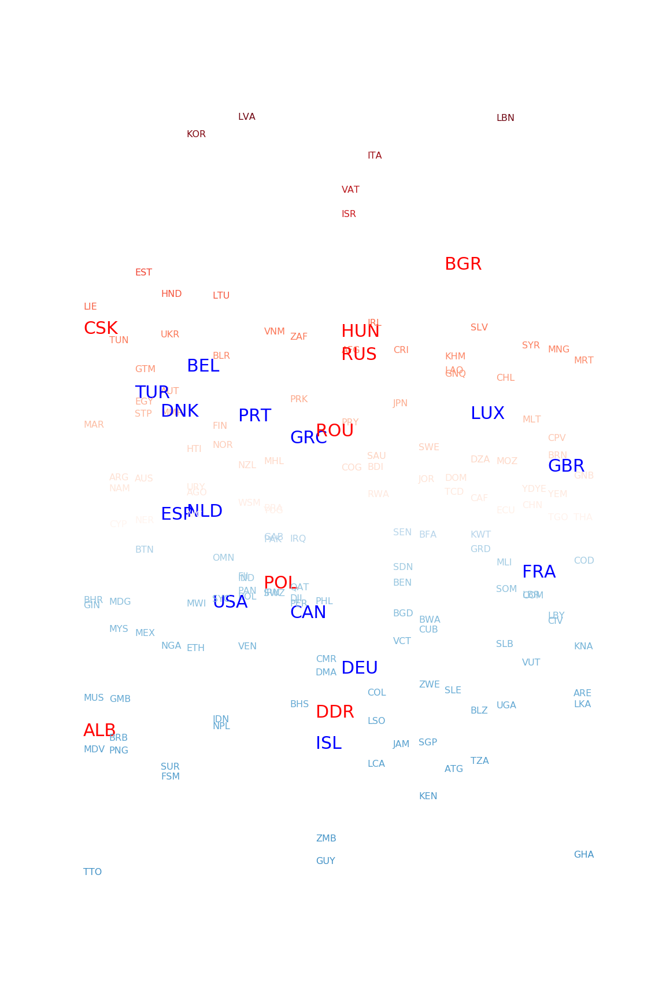

In [201]:
fig, ax1 = plt.subplots(figsize = (8,12))
PlotDimension(ax1, country_projection, 'ideology')
# plt.title('Projection of Countries onto the Dimension of \nthe Cold War Camps (1970-1991)', size=15, pad=50)
plt.show()

<IPython.core.display.Javascript object>


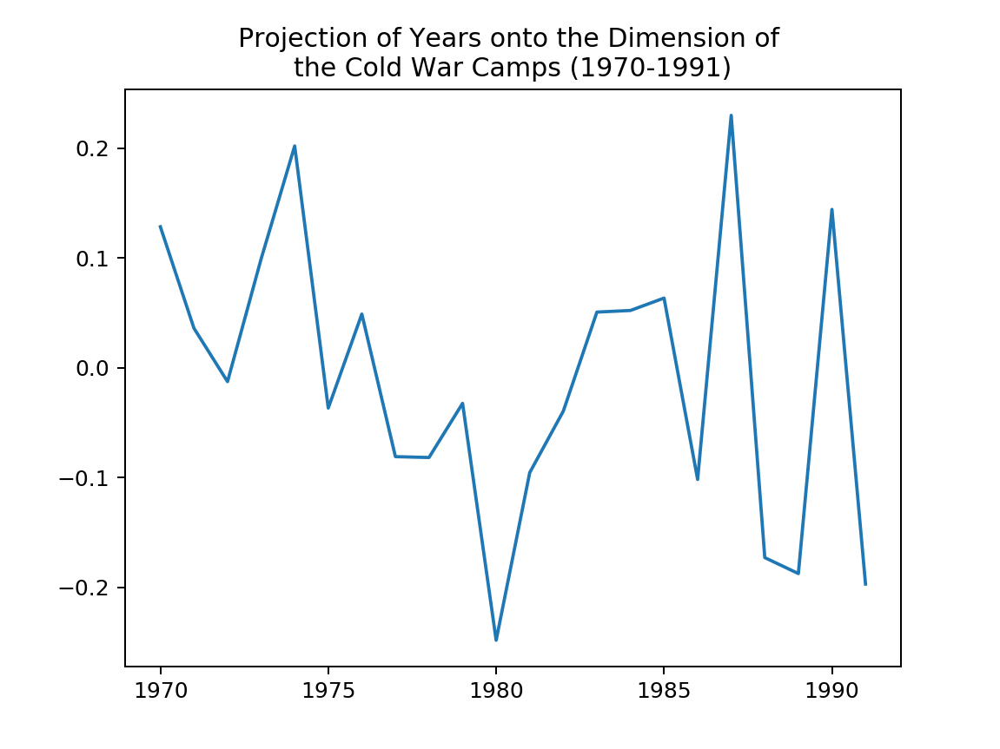

Text(0.5, 1.0, 'Projection of Years onto the Dimension of \nthe Cold War Camps (1970-1991)')

In [1048]:
# Try plot cosine similarities of each year vector and the NATO-WTO dimension
fig, ax = plt.subplots()
ax.plot(year_projection.index, year_projection['ideology'])
plt.title('Projection of Years onto the Dimension of \nthe Cold War Camps (1970-1991)')

### Visualization of the Semantic Space

#### Visualization of the semantic space trained using 1970-1991 subset

In [1049]:
# perform doc2vec using the 1970-1991 subset
target = ungdc_df[ungdc_df['year'].apply(lambda x: int(x)) < 1992]
ungdc_d2v_1970_1991 = gensim.models.doc2vec.Doc2Vec(target['tagged_text'])
ungdc_d2v_1970_1991.save('ungdc_d2v_1970-1991')

In [212]:
# vectors to visualize
targetDocs = [doc + '_cold' for doc in list(target['country_code'].unique())]
targetWords = ['capitalism', 'socialism']

# get the vectors of the target countries/words
vectsSubMatrix1 = []
for doc in targetDocs: 
    vectsSubMatrix1.append(ungdc_d2v_1970_1991.docvecs[doc])

for word in targetWords: 
    vectsSubMatrix1.append(ungdc_d2v_1970_1991.wv[word])

vectsSubMatrix1 = np.array(vectsSubMatrix1)

doc_color = []
# get the vectors of the documents <country_year>
vectsSubMatrix2 = []
# if_absence = []
for doc in targetDocs: 
    if doc in [code + '_cold' for code in NATO]: 
        color = 'blue'
    elif doc in [code + '_cold' for code in WTO]: 
        color = 'red'
    else: 
        color = 'grey'
    for year in range(1970, 1992): 
        try: 
            vectsSubMatrix2.append(ungdc_d2v_1970_1991.docvecs[doc.split('_')[0] + '_' + str(year) + '_cold'])
            doc_color.append(color)
#             if_absence.append(False)
        except KeyError: 
#             if_absence.append(True)
            continue
vectsSubMatrix2 = np.array(vectsSubMatrix2)

In [213]:
num_tag = vectsSubMatrix1.shape[0]
num_doc = vectsSubMatrix2.shape[0]

In [214]:
num_tag

171

In [215]:
num_doc

3048

In [216]:
len(doc_color)

3048

In [217]:
# reduce dimension to visualize the targets

ungdc_d2v_1970_1991_all_vecs= np.concatenate([vectsSubMatrix1, vectsSubMatrix2])
# T-SNE dimension reduction
ungdc_d2v_1970_1991_tsne = sklearn.manifold.TSNE(n_components = 2).fit_transform(ungdc_d2v_1970_1991_all_vecs)

<IPython.core.display.Javascript object>


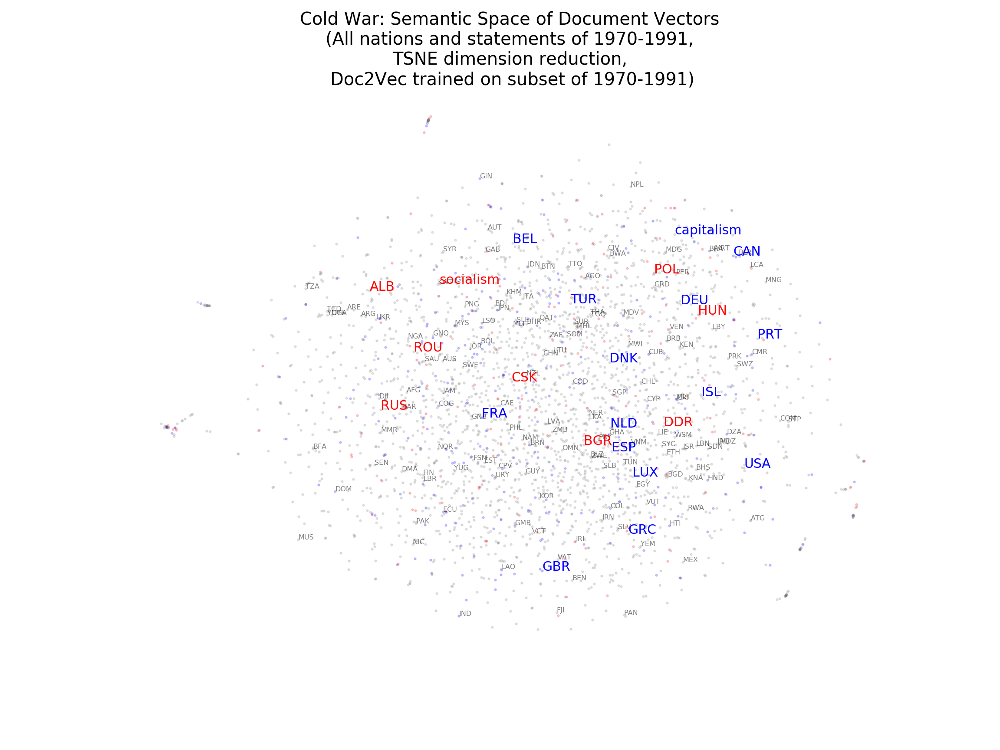

In [218]:
# Plot the results of tags and docs together
fig, ax = plt.subplots(figsize = (16, 12))
ax.set_frame_on(False)

# scatter the docs <country_year>
for i, vec in enumerate(ungdc_d2v_1970_1991_tsne[:num_doc]): 
    plt.scatter(vec[0], vec[1], alpha=0.2, color=doc_color[i], s=5)    

    
# annotate the tags
for i, tag in enumerate(targetDocs + targetWords): 
    if tag in [code + '_cold' for code in NATO] + ['capitalism']: 
        color = 'blue'
        alpha = 1
        size = 15
    elif tag in [code + '_cold' for code in WTO] + ['socialism']: 
        color = 'red'
        alpha = 1
        size = 15
    else: 
        color = 'black'
        alpha = 0.5
        size = 8
        
    ax.annotate(tag.split('_')[0], (ungdc_d2v_1970_1991_tsne[i+num_tag, 0], ungdc_d2v_1970_1991_tsne[i+num_tag, 1]), size=size, color=color, alpha=alpha)
        

plt.xticks(())
plt.yticks(())
plt.title('Cold War: Semantic Space of Document Vectors \n(All nations and statements of 1970-1991, \nTSNE dimension reduction, \nDoc2Vec trained on subset of 1970-1991)', size=20)
plt.show()

#### Visualization of the semantic space trained using the total dataset

In [203]:
# vectors to visualize
targetDocs = [doc + '_cold' for doc in list(target['country_code'].unique())]
targetWords = ['capitalism', 'socialism']

# get the vectors of the target countries/words
vectsSubMatrix1 = []
for doc in targetDocs: 
    vectsSubMatrix1.append(ungdc_d2v.docvecs[doc])

for word in targetWords: 
    vectsSubMatrix1.append(ungdc_d2v.wv[word])

vectsSubMatrix1 = np.array(vectsSubMatrix1)

doc_color = []
# get the vectors of the documents <country_year>
vectsSubMatrix2 = []
# if_absence = []
for doc in targetDocs: 
    if doc in [code + '_cold' for code in NATO]: 
        color = 'blue'
    elif doc in [code + '_cold' for code in WTO]: 
        color = 'red'
    else: 
        color = 'grey'
    for year in range(1970, 1992): 
        try: 
            vectsSubMatrix2.append(ungdc_d2v.docvecs[doc.split('_')[0] + '_' + str(year) + '_cold'])            
            doc_color.append(color)
#             if_absence.append(False)
        except KeyError: 
#             if_absence.append(True)
            continue
vectsSubMatrix2 = np.array(vectsSubMatrix2)

In [204]:
num_tag = vectsSubMatrix1.shape[0]
num_doc = vectsSubMatrix2.shape[0]

In [205]:
num_tag

171

In [206]:
num_doc

3048

In [207]:
len(doc_color)

3048

In [208]:
# reduce dimension to visualize the targets

ungdc_d2v_all_vecs= np.concatenate([vectsSubMatrix1, vectsSubMatrix2])
# T-SNE dimension reduction
ungdc_d2v_tsne = sklearn.manifold.TSNE(n_components = 2).fit_transform(ungdc_d2v_all_vecs)

<IPython.core.display.Javascript object>


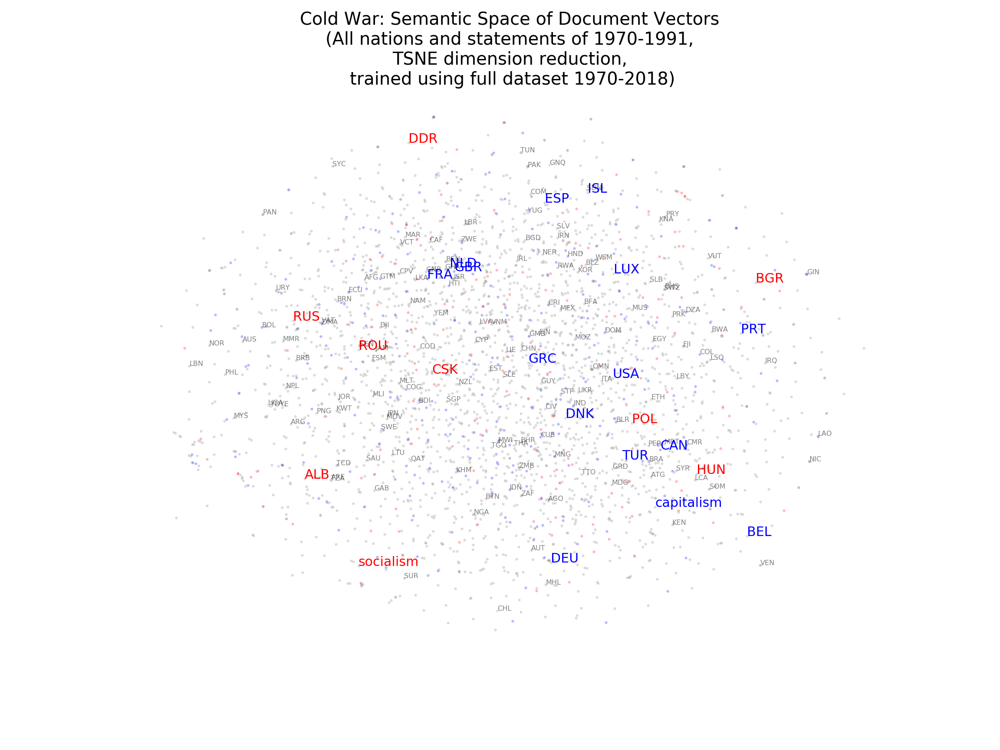

In [210]:
# Plot the results of tags and docs together
fig, ax = plt.subplots(figsize = (16, 12))
ax.set_frame_on(False)

# scatter the docs <country_year>
for i, vec in enumerate(ungdc_d2v_tsne[:num_doc]): 
    plt.scatter(vec[0], vec[1], alpha=0.2, color=doc_color[i], s=5)    

    
# annotate the tags
for i, tag in enumerate(targetDocs + targetWords): 
    if tag in [code + '_cold' for code in NATO] + ['capitalism']: 
        color = 'blue'
        alpha = 1
        size = 15
    elif tag in [code + '_cold' for code in WTO] + ['socialism']: 
        color = 'red'
        alpha = 1
        size = 15
    else: 
        color = 'black'
        alpha = 0.5
        size = 8
        
    ax.annotate(tag.split('_')[0], (ungdc_d2v_tsne[i+num_tag, 0], ungdc_d2v_tsne[i+num_tag, 1]), size=size, color=color, alpha=alpha)
        

plt.xticks(())
plt.yticks(())
plt.title('Cold War: Semantic Space of Document Vectors \n(All nations and statements of 1970-1991, \nTSNE dimension reduction, \ntrained using full dataset 1970-2018)', size=20)
plt.show()

#### Visualization of only the documents related to NATO and WTO of 1970-1991 in the semantic space trained using the total datase

In [1091]:
# words to create dimensions
targetDocs = [doc + '_cold' for doc in NATO + WTO]
targetWords = ['capitalism', 'socialism']

# get the vectors of the target countries/words
vectsSubMatrix1 = []
for doc in targetDocs: 
    vectsSubMatrix1.append(ungdc_d2v.docvecs[doc])

for word in targetWords: 
    vectsSubMatrix1.append(ungdc_d2v.wv[word])

vectsSubMatrix1 = np.array(vectsSubMatrix1)

doc_color = []
# get the vectors of the documents <country_year>
vectsSubMatrix2 = []
# if_absence = []
for doc in targetDocs: 
    if doc in [code + '_cold' for code in NATO] + ['capitalism']: 
        color = 'blue'
    elif doc in [code + '_cold' for code in WTO] + ['socialism']: 
        color = 'red'
    else: 
        color = 'grey'
    for year in range(1970, 1992): 
        try: 
            vectsSubMatrix2.append(ungdc_d2v.docvecs[doc.split('_')[0] + '_' + str(year) + '_cold'])
            doc_color.append(color)
#             if_absence.append(False)
        except KeyError: 
#             if_absence.append(True)
            continue
vectsSubMatrix2 = np.array(vectsSubMatrix2)

In [1092]:
num_tag = vectsSubMatrix1.shape[0]
num_doc = vectsSubMatrix2.shape[0]

In [1093]:
num_tag

24

In [1094]:
num_doc

461

In [1095]:
len(doc_color)

461

In [1098]:
# reduce dimension to visualize the targets

ungdc_d2v_all_vecs= np.concatenate([vectsSubMatrix1, vectsSubMatrix2])
# T-SNE dimension reduction
ungdc_d2v_tsne = sklearn.manifold.TSNE(n_components = 2).fit_transform(ungdc_d2v_all_vecs)

<IPython.core.display.Javascript object>


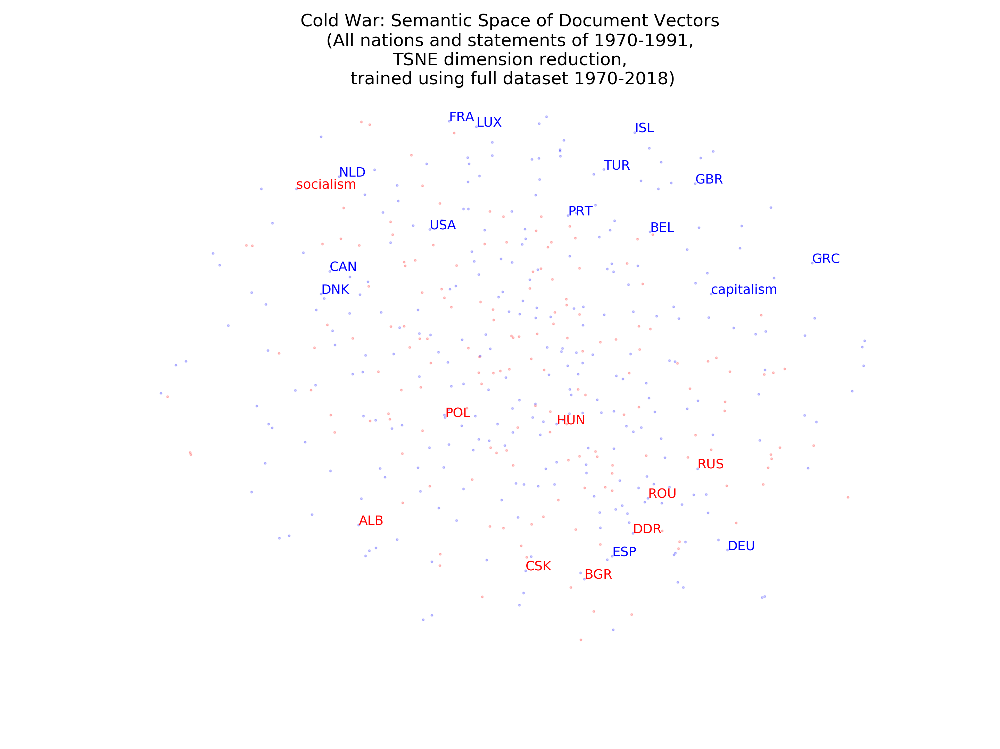

In [1099]:
# Plot the results of tags and docs together
fig, ax = plt.subplots(figsize = (16, 12))
ax.set_frame_on(False)

# scatter the docs <country_year>
for i, vec in enumerate(ungdc_d2v_tsne[:num_doc]): 
    plt.scatter(vec[0], vec[1], alpha=0.2, color=doc_color[i], s=5)    

    
# annotate the tags
for i, tag in enumerate(targetDocs + targetWords): 
    if tag in [code + '_cold' for code in NATO] + ['capitalism']: 
        color = 'blue'
        alpha = 1
        size = 15
    elif tag in [code + '_cold' for code in WTO] + ['socialism']: 
        color = 'red'
        alpha = 1
        size = 15
    else: 
        color = 'black'
        alpha = 0.5
        size = 8
        
    ax.annotate(tag.split('_')[0], (ungdc_d2v_tsne[i+num_tag, 0], ungdc_d2v_tsne[i+num_tag, 1]), size=size, color=color, alpha=alpha)
        

plt.xticks(())
plt.yticks(())
plt.title('Cold War: Semantic Space of Document Vectors \n(All nations and statements of 1970-1991, \nTSNE dimension reduction, \ntrained using full dataset 1970-2018)', size=20)
plt.show()

<IPython.core.display.Javascript object>


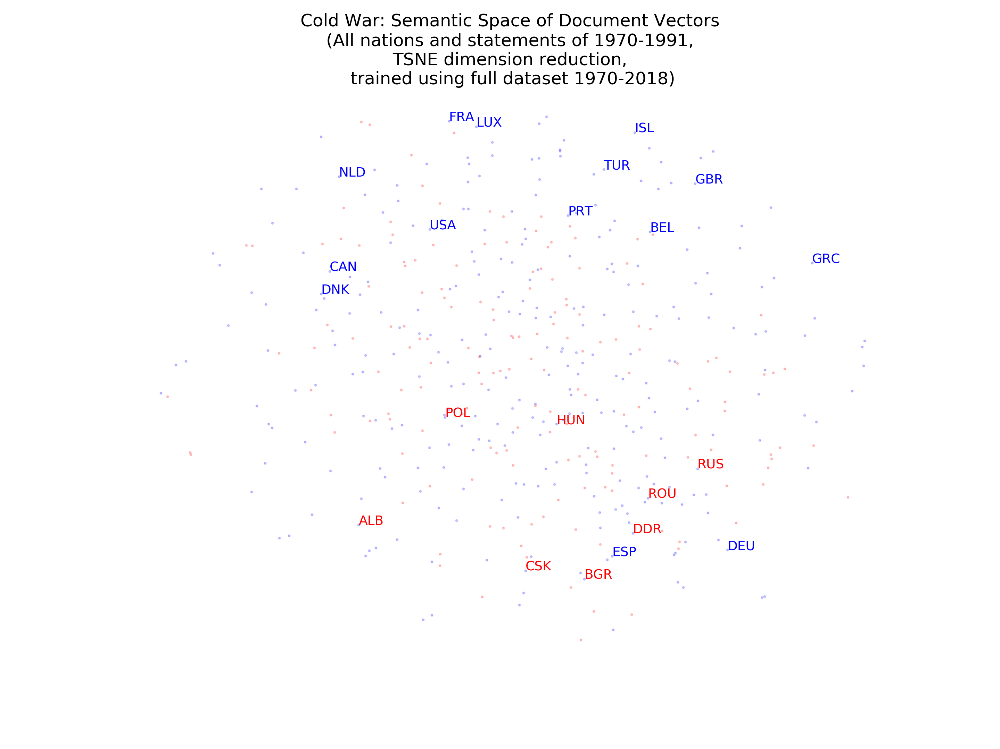

In [1100]:
# Not ploting socialism and capitalism
# Plot the results of tags and docs together
fig, ax = plt.subplots(figsize = (16, 12))
ax.set_frame_on(False)

# scatter the docs <country_year>
for i, vec in enumerate(ungdc_d2v_tsne[:num_doc]): 
    plt.scatter(vec[0], vec[1], alpha=0.2, color=doc_color[i], s=5)    

    
# annotate the tags
for i, tag in enumerate(targetDocs): 
    if tag in [code + '_cold' for code in NATO] + ['capitalism']: 
        color = 'blue'
        alpha = 1
        size = 15
    elif tag in [code + '_cold' for code in WTO] + ['socialism']: 
        color = 'red'
        alpha = 1
        size = 15
    else: 
        color = 'black'
        alpha = 0.5
        size = 8
        
    ax.annotate(tag.split('_')[0], (ungdc_d2v_tsne[i+num_tag, 0], ungdc_d2v_tsne[i+num_tag, 1]), size=size, color=color, alpha=alpha)
        

plt.xticks(())
plt.yticks(())
plt.title('Cold War: Semantic Space of Document Vectors \n(All nations and statements of 1970-1991, \nTSNE dimension reduction, \ntrained using full dataset 1970-2018)', size=20)
plt.show()

### Topic dynamics in Doc2Vec semantic space

In [132]:
ungdc_d2v = gensim.models.doc2vec.Doc2Vec.load('ungdc_d2v')

<IPython.core.display.Javascript object>


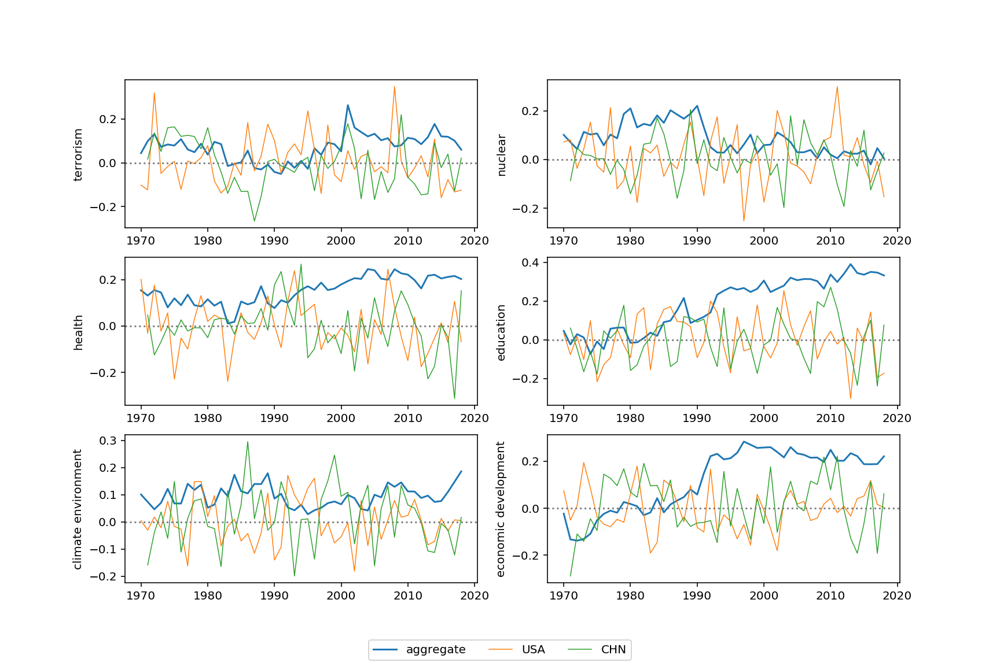

In [144]:
policy_tokens_list = [['terrorism'], ['nuclear'], ['health'], ['education'], ['climate', 'environment'], ['economic', 'development']]

i= 1
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

for ax, policy_tokens in zip(axs.flatten(), policy_tokens_list): 
    policy_mean_vec = np.mean(pd.Series(policy_tokens).apply(lambda x: ungdc_d2v[x])).reshape(1, -1)
    index_list = []
    USA_list = []
    China_list = []
    for year in range (1970, 2019): 
        try: 
            USA_vec = ungdc_d2v.docvecs['USA_' + str(year)].reshape(1, -1)
            USA_list.append(sklearn.metrics.pairwise.cosine_similarity(USA_vec, policy_mean_vec))
        except: 
#             USA_vec = np.nan
            USA_list.append(np.nan)
        try: 
            China_vec = ungdc_d2v.docvecs['CHN_' + str(year)].reshape(1, -1)
            China_list.append(sklearn.metrics.pairwise.cosine_similarity(China_vec, policy_mean_vec))
        except: 
#             China_vec = np.nan
            China_list.append(np.nan)
        year_vec = ungdc_d2v.docvecs[str(year)].reshape(1, -1)
        index_list.append(sklearn.metrics.pairwise.cosine_similarity(year_vec, policy_mean_vec))
#         USA_list.append(sklearn.metrics.pairwise.cosine_similarity(USA_vec, policy_mean_vec))
#         China_list.append(sklearn.metrics.pairwise.cosine_similarity(China_vec, policy_mean_vec))

    index_list = np.array(index_list).reshape(-1)
    USA_list = np.array(USA_list).reshape(-1)
    China_list = np.array(China_list).reshape(-1)
    
    ax.plot(np.arange(1970, 2019), index_list, label='aggregate')
    ax.plot(np.arange(1970, 2019), USA_list, label='USA', linewidth=0.75)
    ax.plot(np.arange(1970, 2019), China_list, label='CHN', linewidth=0.75)
    ax.axhline(y=0, color='grey', linestyle=':')
    
    ax.set_ylabel(' '.join(policy_tokens))
    handles = ax.get_legend_handles_labels()[0]
    labels = ax.get_legend_handles_labels()[1]
    i += 1
    
# fig.suptitle('Dynamics of attention on topics in the Doc2Vec semantic space')
fig.legend(handles, labels, loc='lower center', ncol=3)
plt.show()

In [122]:
handles

[[<matplotlib.lines.Line2D at 0x1a5c820150>,

### Cluster nations based on doc2vec

In [220]:
doc_list = ungdc_df['country_code'].unique()

In [221]:
vectsSubMatrix3 = []

# get the vectors of the target documents
for doc in doc_list: 
    vectsSubMatrix3.append(ungdc_d2v.docvecs[doc])

vectsSubMatrix3 = np.array(vectsSubMatrix3)

In [222]:
# Try K-means clustering using K=8
num_clusters = 8
d2v_k_means_cluster = sklearn.cluster.KMeans(n_clusters=num_clusters, init='k-means++').fit(vectsSubMatrix3)

In [223]:
# nations in each cluster:
cluster_map = pd.DataFrame()
cluster_map['country'] = doc_list
cluster_map['cluster'] = d2v_k_means_cluster.labels_

cluster_members = pd.DataFrame()
for cluster in range(8): 
    column = pd.DataFrame(np.array(cluster_map[cluster_map['cluster'] == cluster]['country']), columns=[f'cluster {cluster}'])
    cluster_members = cluster_members.join(column, how='outer')
cluster_members.fillna('')

,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4,cluster 5,cluster 6,cluster 7
0,AUS,GHA,BEL,ARG,ALB,IRN,TTO,IDN
1,AUT,GMB,CMR,BOL,BLR,IRQ,FJI,IND
2,CAN,KEN,COG,BRA,TUR,KWT,GUY,JPN
3,GBR,LBR,DZA,COL,UKR,LBN,JAM,KHM
4,ISL,SLE,FRA,CRI,YUG,LBY,BRB,LKA
5,ISR,SOM,GIN,CUB,BGR,MAR,BHS,MMR
6,ITA,ZAF,HTI,DOM,CSK,SDN,GRD,PAK
7,NLD,ZMB,MDG,ECU,CYP,SYR,PNG,PHL
8,NOR,ETH,RWA,GTM,GRC,TUN,SUR,SGP
9,NZL,MUS,TGO,HND,HUN,EGY,WSM,THA


In [227]:
# Perform PCA to reduce dimensions and visualize in 2-D graphs
d2v_vects_pca_to2d = sklearn.decomposition.PCA(n_components = 2).fit_transform(vectsSubMatrix3)

colors = list(plt.cm.rainbow(np.linspace(0,1, num_clusters)))
colors_p = [colors[l] for l in d2v_k_means_cluster.labels_]

<IPython.core.display.Javascript object>


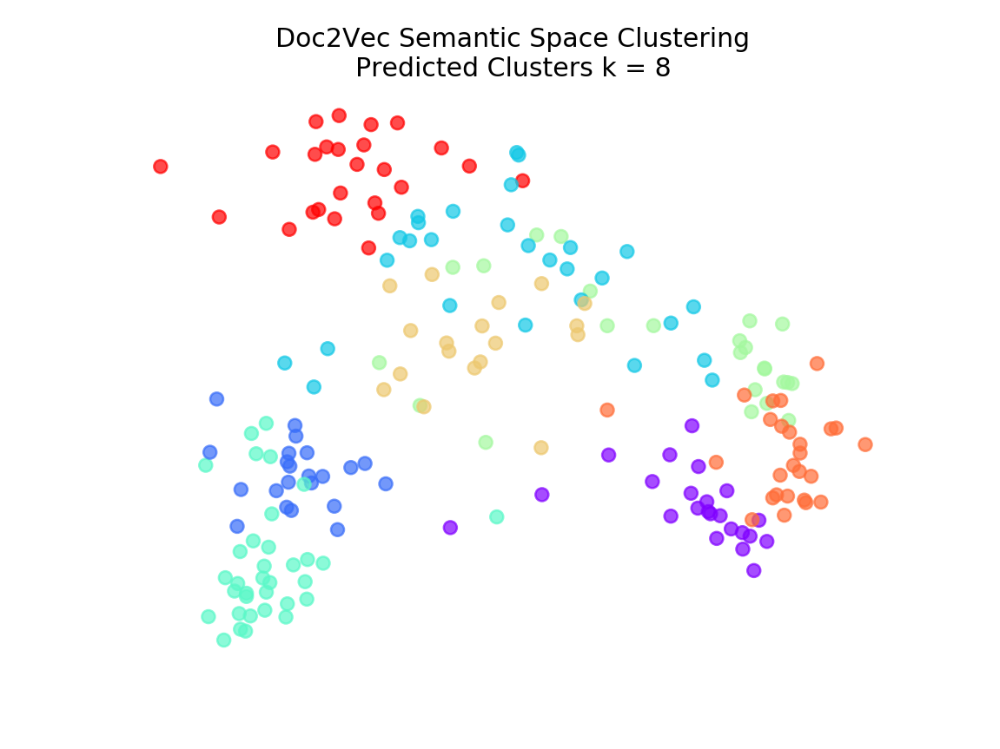

In [466]:
fig, ax = plt.subplots()
ax.set_frame_on(False)
ax.scatter(d2v_vects_pca_to2d[:, 0], d2v_vects_pca_to2d[:, 1], color = colors_p, alpha = 0.7)
plt.xticks(())
plt.yticks(())
plt.title('Doc2Vec Semantic Space Clustering\nPredicted Clusters k = {}'.format(num_clusters))
plt.show()

In [533]:
# Optimize for the best value for K. 

def plotSilhouette(n_clusters, X, reducedPCA_data, plot=True):
    if plot: 
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (15,5))

        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        clusterer = sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        silhouette_avg = sklearn.metrics.silhouette_score(X, cluster_labels)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = sklearn.metrics.silhouette_samples(X, cluster_labels)

        y_lower = 10

        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            cmap = matplotlib.cm.get_cmap("nipy_spectral")
            color = cmap(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed

        cmap = matplotlib.cm.get_cmap("nipy_spectral")
        colors = cmap(np.linspace(0,1, n_clusters))
        colors_p = [colors[l] for l in cluster_labels]

    #     cmap = matplotlib.cm.get_cmap("nipy_spectral")
    #     colors = cmap(float(i) / n_clusters)
        ax2.scatter(reducedPCA_data[:, 0], reducedPCA_data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors_p)

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        PCA = sklearn.decomposition.PCA
        pca = PCA(n_components = 2).fit(X)
        projected_centers = pca.transform(centers)
        # Draw white circles at cluster centers
        ax2.scatter(projected_centers[:, 0], projected_centers[:, 1],
                    marker='o', c="white", alpha=1, s=200)

        for i, c in enumerate(projected_centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("PC 1")
        ax2.set_ylabel("PC 2")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')
        plt.show()
        print("For n_clusters = {}, The average silhouette_score is : {:.3f}".format(n_clusters, silhouette_avg))

        return silhouette_avg
    
    else: 
        clusterer = sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)
        silhouette_avg = sklearn.metrics.silhouette_score(X, cluster_labels)
        return silhouette_avg

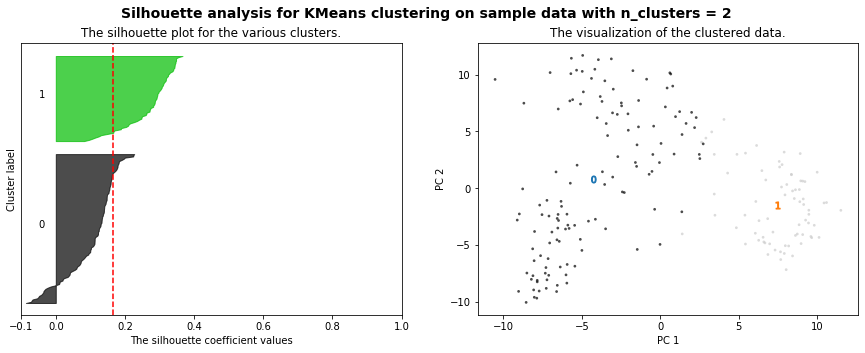

For n_clusters = 2, The average silhouette_score is : 0.164


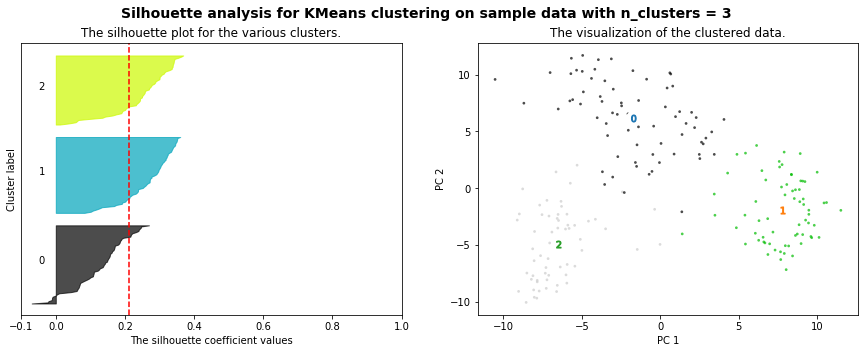

For n_clusters = 3, The average silhouette_score is : 0.213


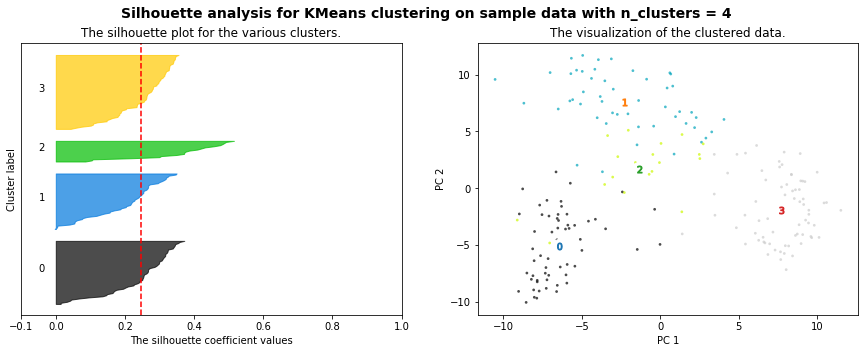

For n_clusters = 4, The average silhouette_score is : 0.246


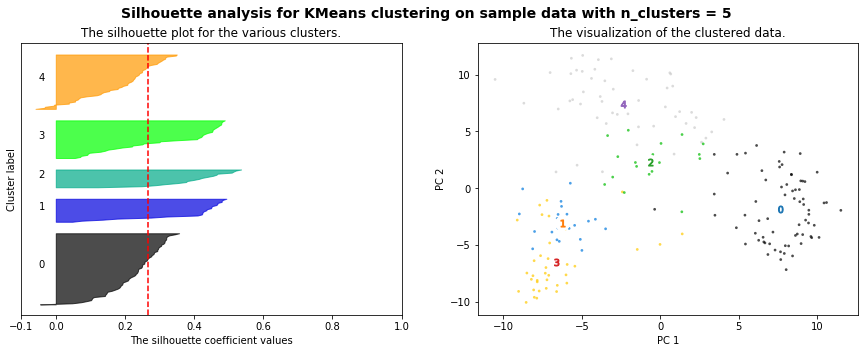

For n_clusters = 5, The average silhouette_score is : 0.266


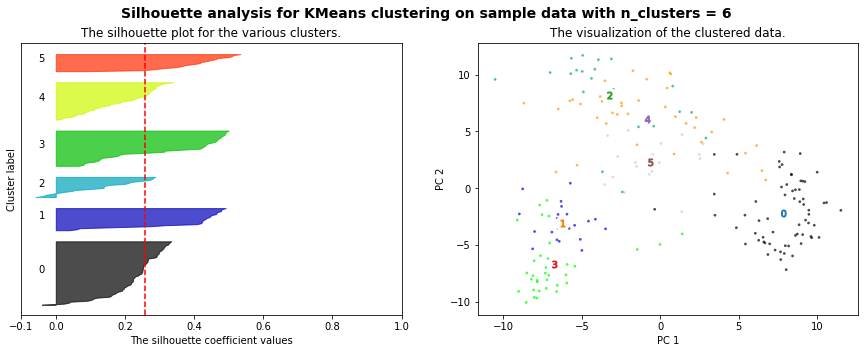

For n_clusters = 6, The average silhouette_score is : 0.258


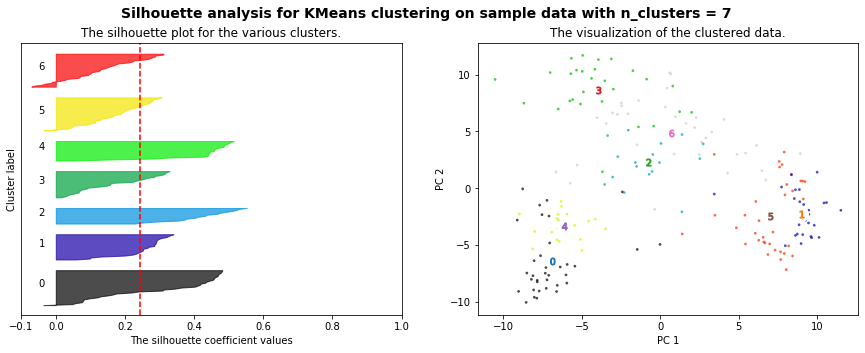

For n_clusters = 7, The average silhouette_score is : 0.245


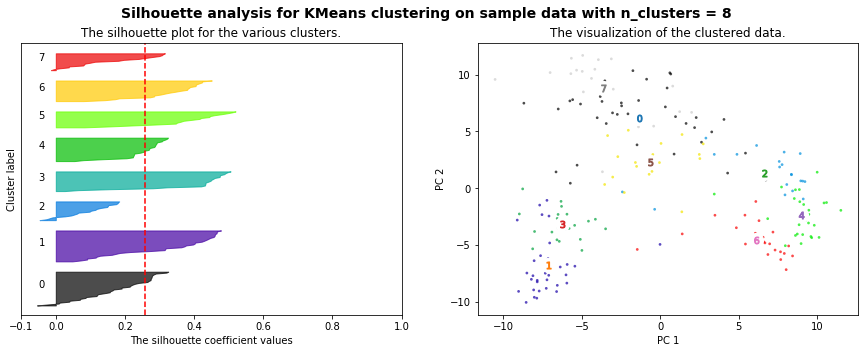

For n_clusters = 8, The average silhouette_score is : 0.257


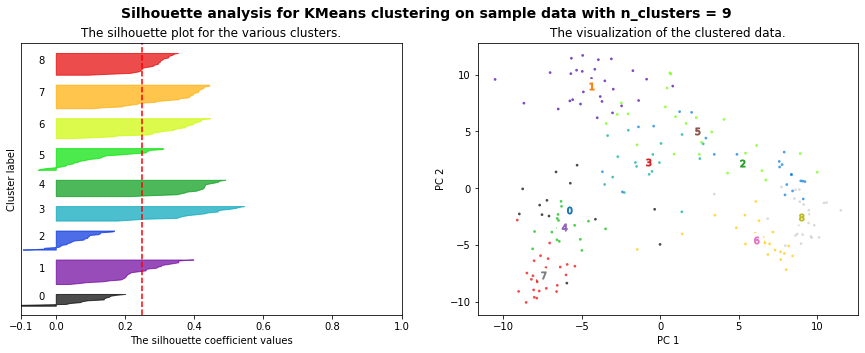

For n_clusters = 9, The average silhouette_score is : 0.251


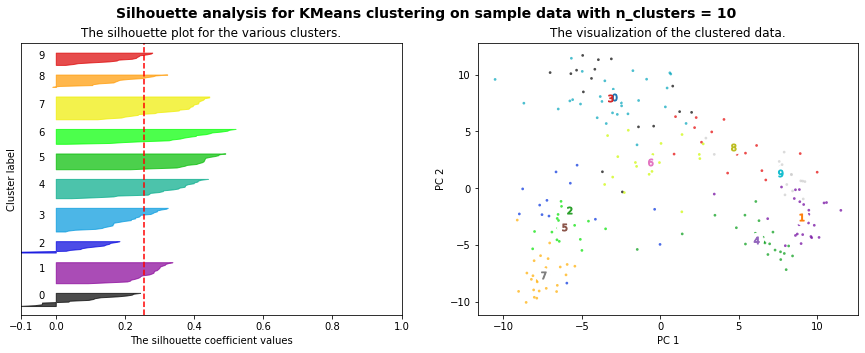

For n_clusters = 10, The average silhouette_score is : 0.254


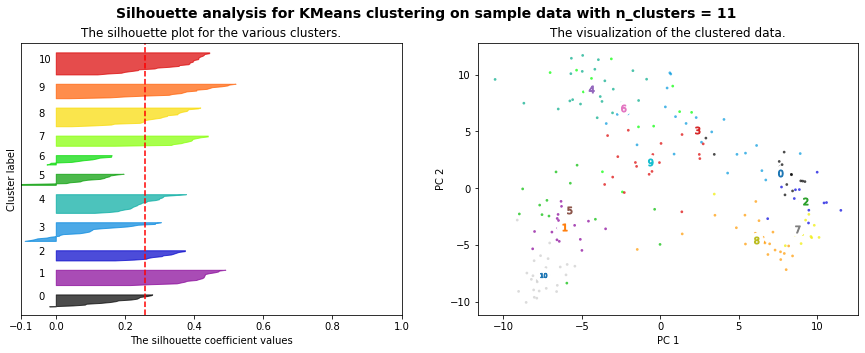

For n_clusters = 11, The average silhouette_score is : 0.257


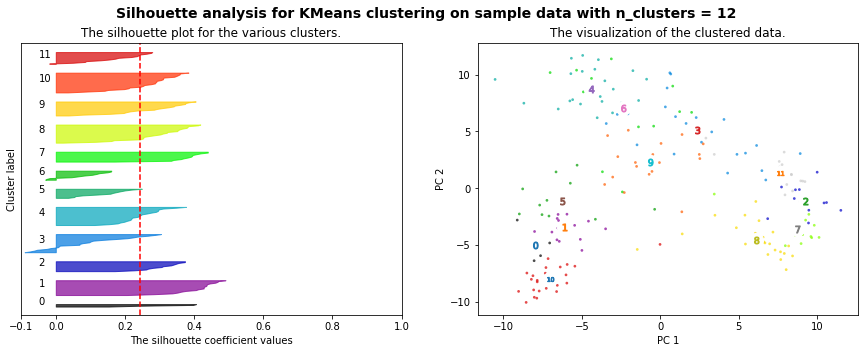

For n_clusters = 12, The average silhouette_score is : 0.244


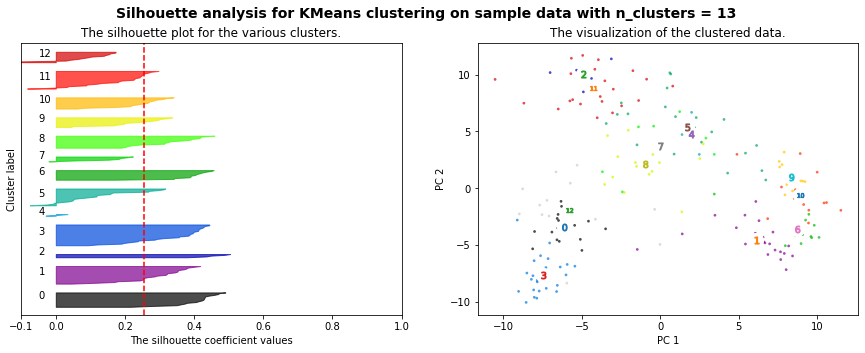

For n_clusters = 13, The average silhouette_score is : 0.255


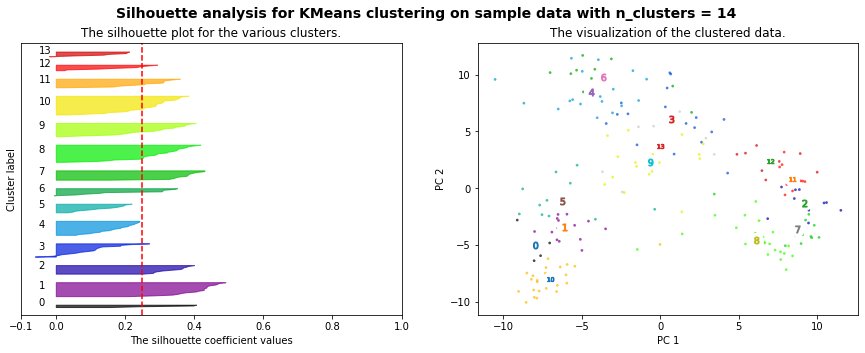

For n_clusters = 14, The average silhouette_score is : 0.248


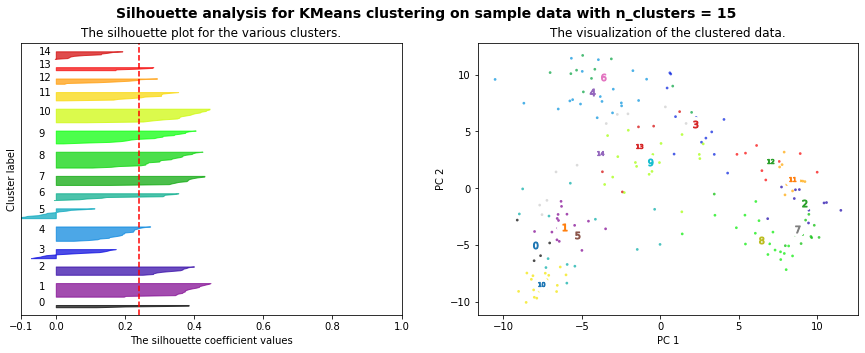

For n_clusters = 15, The average silhouette_score is : 0.239


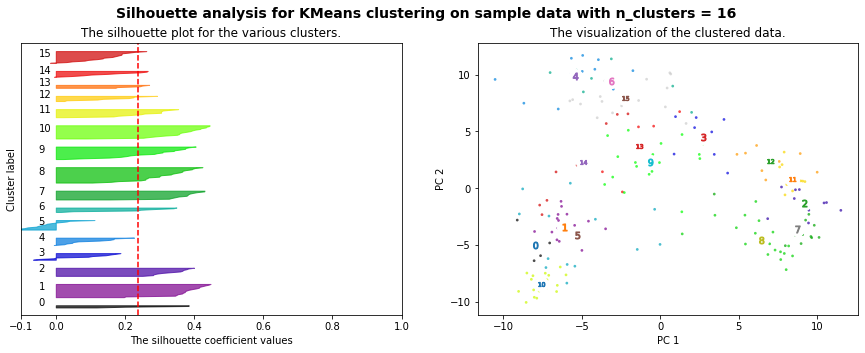

For n_clusters = 16, The average silhouette_score is : 0.236


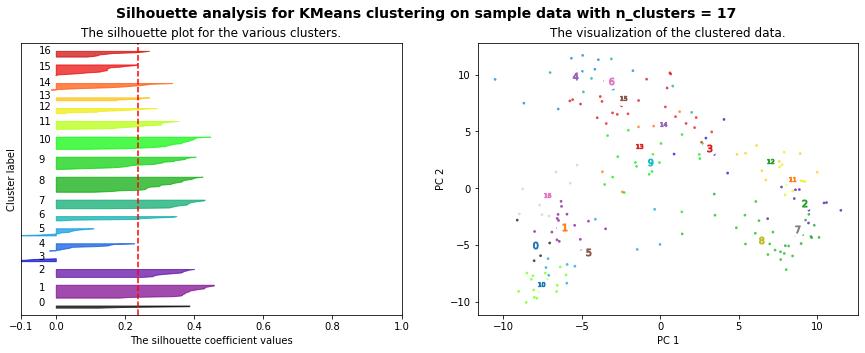

For n_clusters = 17, The average silhouette_score is : 0.237


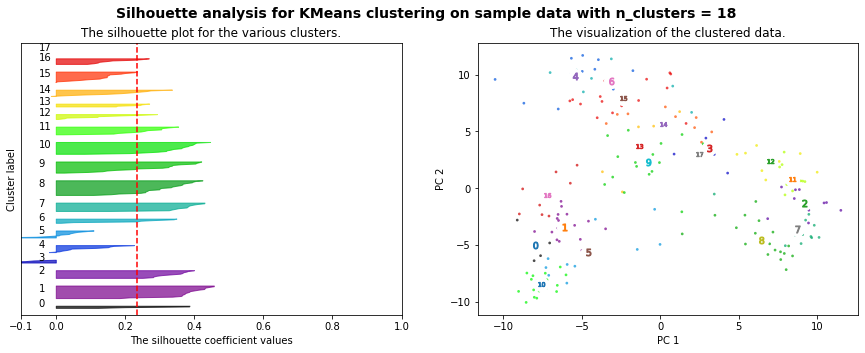

For n_clusters = 18, The average silhouette_score is : 0.235


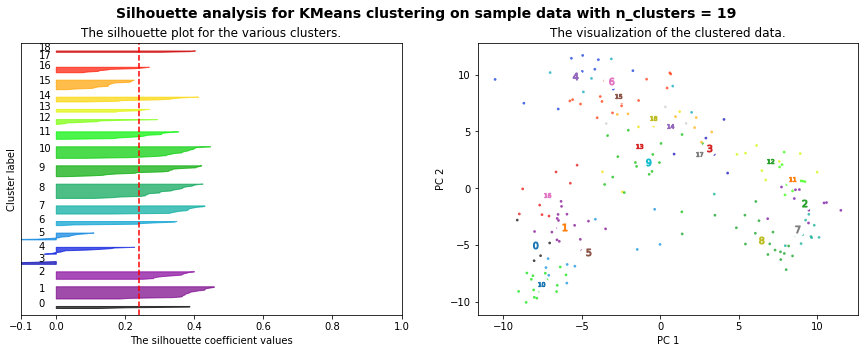

For n_clusters = 19, The average silhouette_score is : 0.241


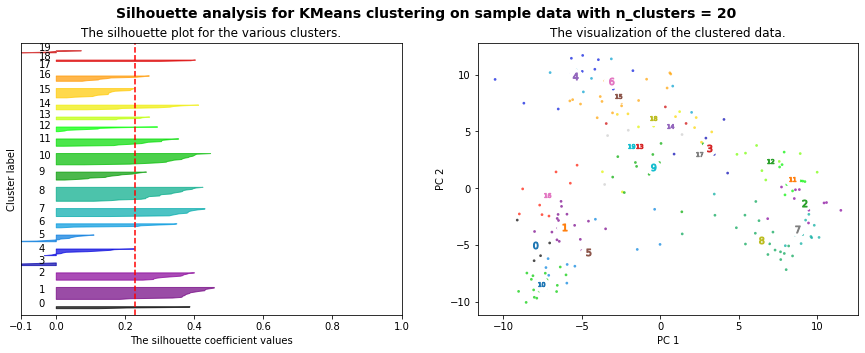

For n_clusters = 20, The average silhouette_score is : 0.228


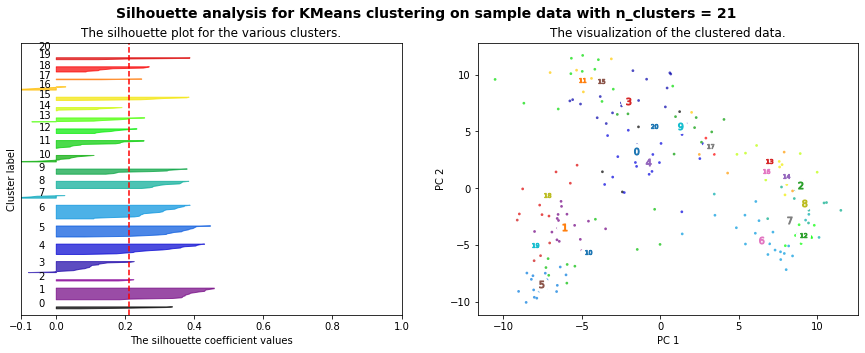

For n_clusters = 21, The average silhouette_score is : 0.212


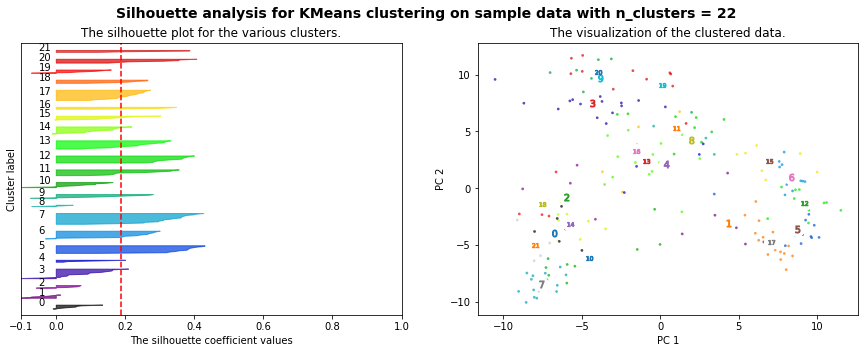

For n_clusters = 22, The average silhouette_score is : 0.190


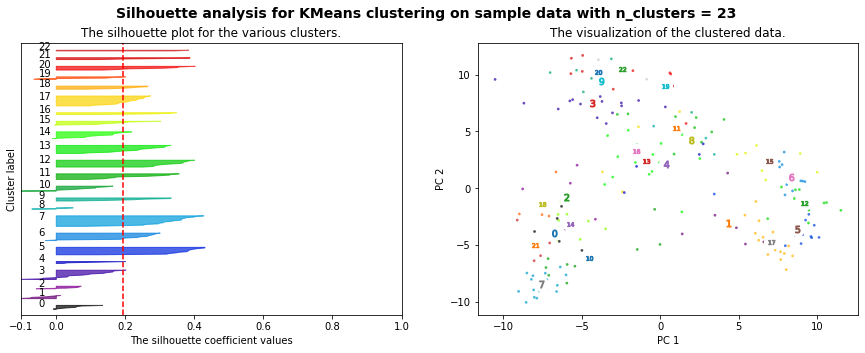

For n_clusters = 23, The average silhouette_score is : 0.194


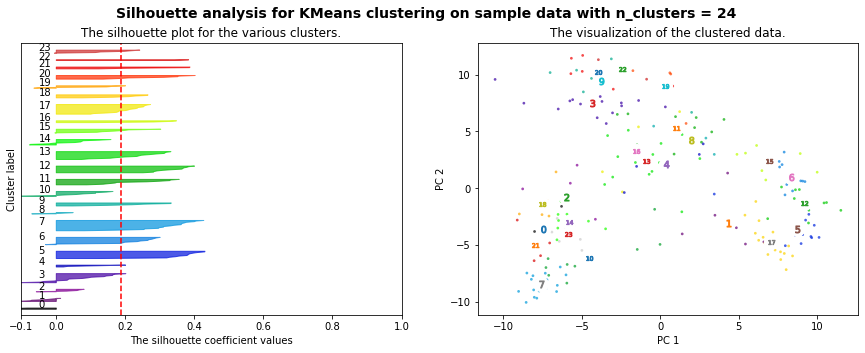

For n_clusters = 24, The average silhouette_score is : 0.189


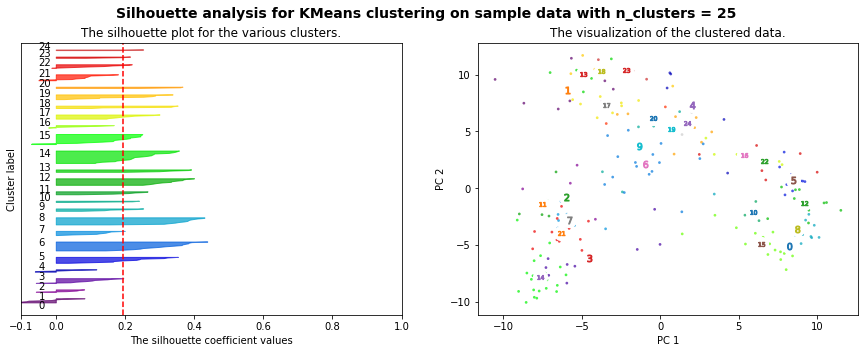

For n_clusters = 25, The average silhouette_score is : 0.193


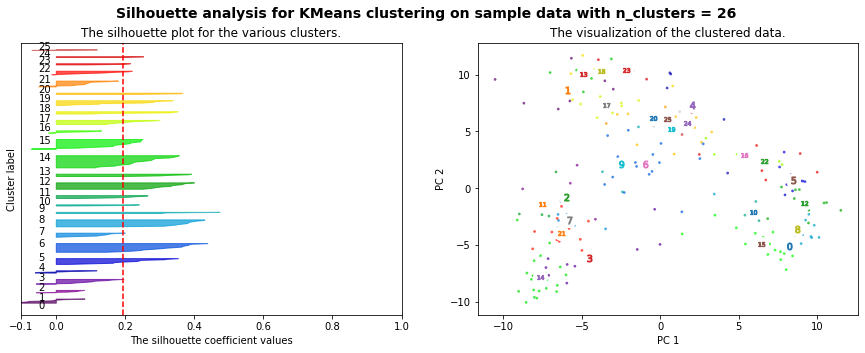

For n_clusters = 26, The average silhouette_score is : 0.195


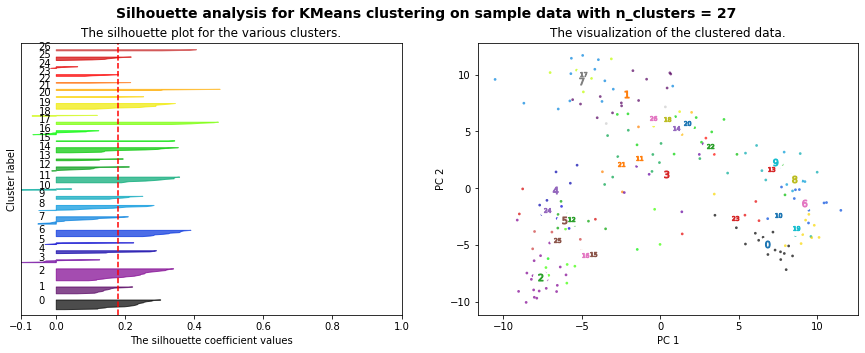

For n_clusters = 27, The average silhouette_score is : 0.180


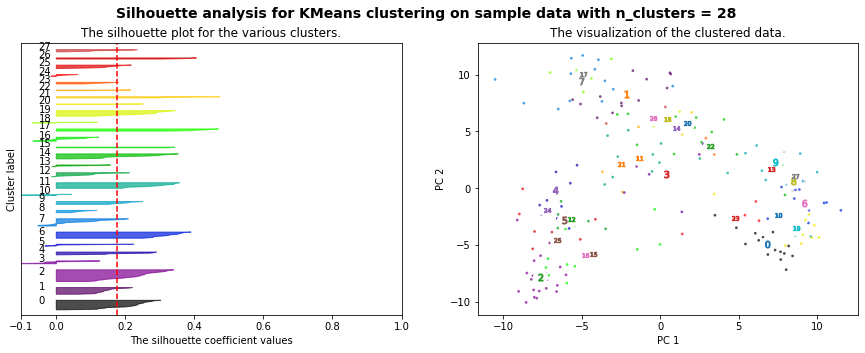

For n_clusters = 28, The average silhouette_score is : 0.176


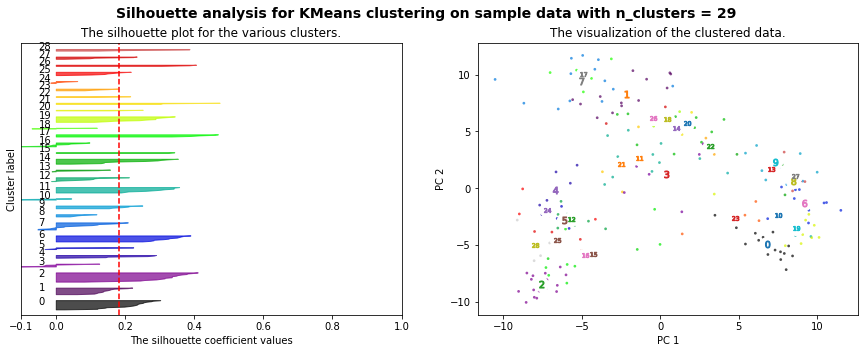

For n_clusters = 29, The average silhouette_score is : 0.184


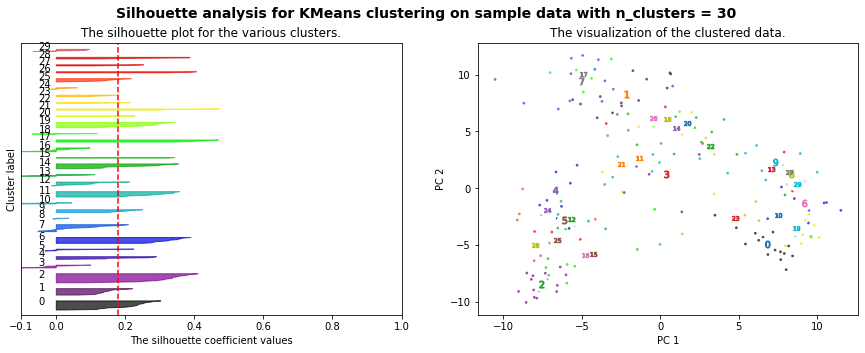

For n_clusters = 30, The average silhouette_score is : 0.181


In [534]:
# try different number of clusters
%matplotlib inline
silhouette_avg_list = []
for num in range(2, 31):
    silhouette_avg_list.append(plotSilhouette(num, vectsSubMatrix3, d2v_vects_pca_to2d))

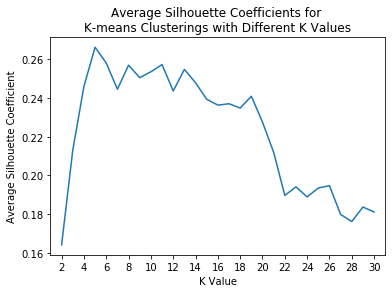

In [539]:
fig, ax = plt.subplots()
plt.plot(np.arange(2, 31), np.array(silhouette_avg_list))
ax.xaxis.set_major_locator(MaxNLocator(integer=True, steps=[1, 2, 10], min_n_ticks=5))
ax.set_xlim(1, 31)
plt.title('Average Silhouette Coefficients for \nK-means Clusterings with Different K Values')
plt.ylabel('Average Silhouette Coefficient')
plt.xlabel('K Value')
plt.show()

In [225]:
# K=5 is optimal
num_clusters = 5
d2v_k_means_cluster = sklearn.cluster.KMeans(n_clusters=num_clusters, init='k-means++').fit(vectsSubMatrix3)
# nations in each cluster:
cluster_map = pd.DataFrame()
cluster_map['country'] = doc_list
cluster_map['cluster'] = d2v_k_means_cluster.labels_

cluster_members = pd.DataFrame()
for cluster in range(num_clusters): 
    column = pd.DataFrame(np.array(cluster_map[cluster_map['cluster'] == cluster]['country']), columns=[f'cluster {cluster}'])
    cluster_members = cluster_members.join(column, how='outer')
cluster_members.fillna('').head(30)

,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4
0,AUS,ALB,ARG,IRN,BEL
1,CAN,AUT,BOL,IRQ,CMR
2,GBR,BLR,BRA,ISR,COG
3,GHA,ISL,COL,KWT,DZA
4,GMB,ITA,CRI,LBN,FRA
5,IDN,JPN,CUB,LBY,GIN
6,IND,KHM,DOM,MAR,HTI
7,KEN,NLD,ECU,SDN,MDG
8,LBR,NOR,GTM,SYR,RWA
9,LKA,TUR,HND,TUN,TGO


In [232]:
# print(cluster_members.fillna('').to_latex(index=False, caption='K-means clustering of Doc2Vec state vectors', label='tab:doc2vec clustering'))

<IPython.core.display.Javascript object>


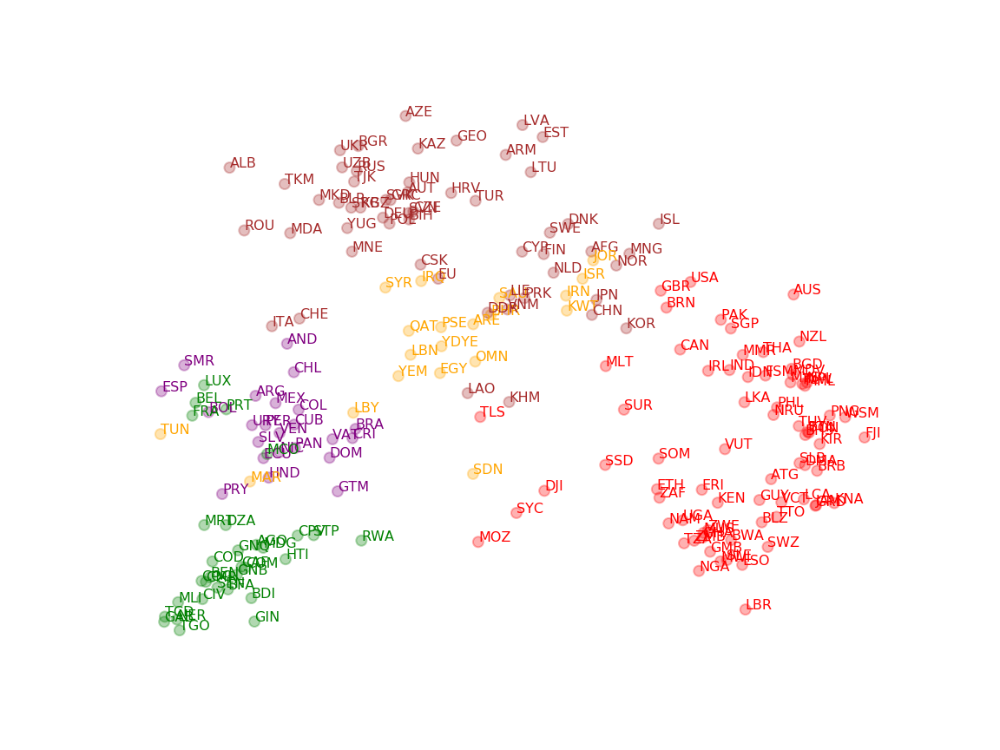

In [229]:
# Perform PCA to reduce dimensions and visualize in 2-D graphs
# d2v_vects_pca_to2d = sklearn.decomposition.PCA(n_components = 2).fit_transform(vectsSubMatrix3)

# colors = list(plt.get_cmap('tab10')(np.linspace(0,1, num_clusters)))
colors = ['red', 'brown', 'purple', 'orange', 'green']
colors_p = [colors[l] for l in d2v_k_means_cluster.labels_]


fig, ax = plt.subplots(figsize=(8, 6))
ax.set_frame_on(False)
ax.scatter(d2v_vects_pca_to2d[:, 0], d2v_vects_pca_to2d[:, 1], color=colors_p, alpha=0.3)
for index, doc in enumerate(doc_list): 
    ax.annotate(doc, (d2v_vects_pca_to2d[index, 0], d2v_vects_pca_to2d[index, 1]), size=8, color=colors_p[index])
plt.xticks(())
plt.yticks(())
# plt.title('Doc2Vec Semantic Space Clustering Predicted Clusters \n (k = {}; dimension-reduced projection)'.format(num_clusters))
plt.show()